# Let's import a bunch of stuff

In [4]:
import sys
import seaborn as sb
import scanpy.api as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import statsmodels.api as sm
import statsmodels.formula.api as smf
import argparse
import gc
import anndata
import random
import scipy.stats as stats
from decimal import Decimal
import combat
import patsy

%matplotlib inline

In [5]:
%matplotlib inline

##################
# Configure file #
##################
sc.settings.verbosity = 2
sc.settings.autoshow = False

##logging.basicConfig(filename="CLUESImmVar_processed.V4.1.log", level=logging.ERROR)
sc.settings.set_figure_params(dpi=100, dpi_save=600, format='png')

plt.rcParams["image.aspect"] = "equal"
##%matplotlib inline

In [8]:
version = "V5.1"

figdir = "./figures."+version+"/"
sc.settings.figdir = figdir

In [9]:
adata = sc.read("CLUESImmvarMono."+version+".h5ad", cache=False)
adata.shape

Only considering the two last: ['.1', '.h5ad'].
Only considering the two last: ['.1', '.h5ad'].


(221450, 1495)

In [10]:
adata.obs['disease_pop_cov'] = pd.Categorical(adata.obs.apply(lambda row: row['disease_cov'] + row['pop_cov'], axis=1),
                                             categories=['healthyWHITE','sleWHITE','sleASIAN'],
                                             ordered=True)

In [11]:
mod = patsy.dmatrix("~ disease_cov", adata.obs, return_type="dataframe")
mod = mod.reset_index(drop=True)
batch = adata.obs['batch_cov']
batch = batch.reset_index(drop=True)

In [13]:
X_t = adata.X.transpose()
X = adata.X

In [14]:
out = combat.combat(X_t, batch = batch, model=mod)

found 14 batches
found 0 numerical covariates...
found 1 categorical variables:	disease_cov[T.sle]
Standardizing Data across genes.
Fitting L/S model and finding priors
Finding parametric adjustments


Adjusting data


In [15]:
adata.X = out.transpose()

In [16]:
sc.pp.pca(adata, random_state=1, svd_solver='arpack')
sc.pp.neighbors(adata, random_state=1)
sc.tl.umap(adata, random_state=1)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:01:54.31)
computing UMAP
    finished (0:03:43.37)


In [26]:
sc.tl.leiden(adata)

running Leiden clustering
    finished (0:53:07.82)


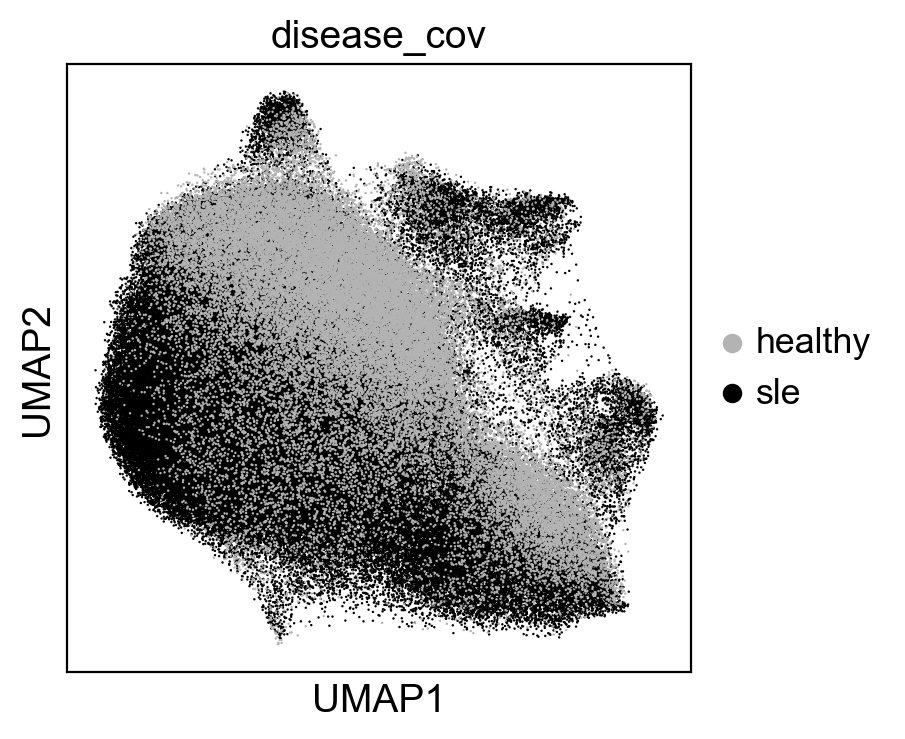

In [18]:
sc.pl.umap(adata, color='disease_cov', size=3, edgecolor="none", palette=['#B3B3B3','#000000'])

Up to anndata 0.6.12, `.copy()` cast a non-'float32' `.X` to 'float32'. Now, the dtype 'float64' is maintained. 


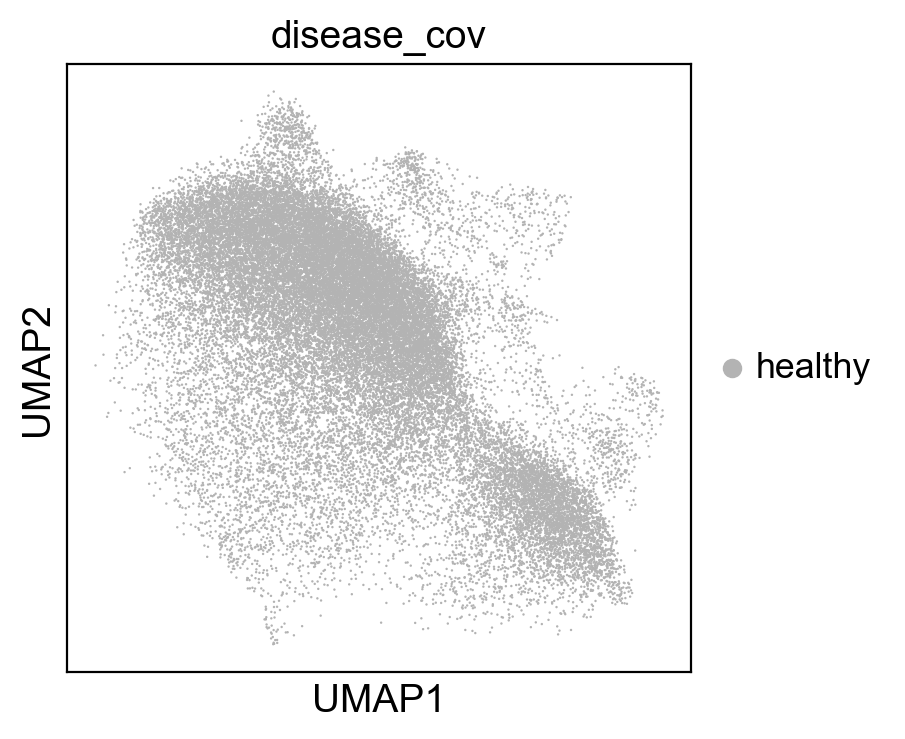

In [23]:
sc.pl.umap(adata[adata.obs.batch_cov.str.contains("immvar")], color='disease_cov', size=3, edgecolor="none")

Up to anndata 0.6.12, `.copy()` cast a non-'float32' `.X` to 'float32'. Now, the dtype 'float64' is maintained. 


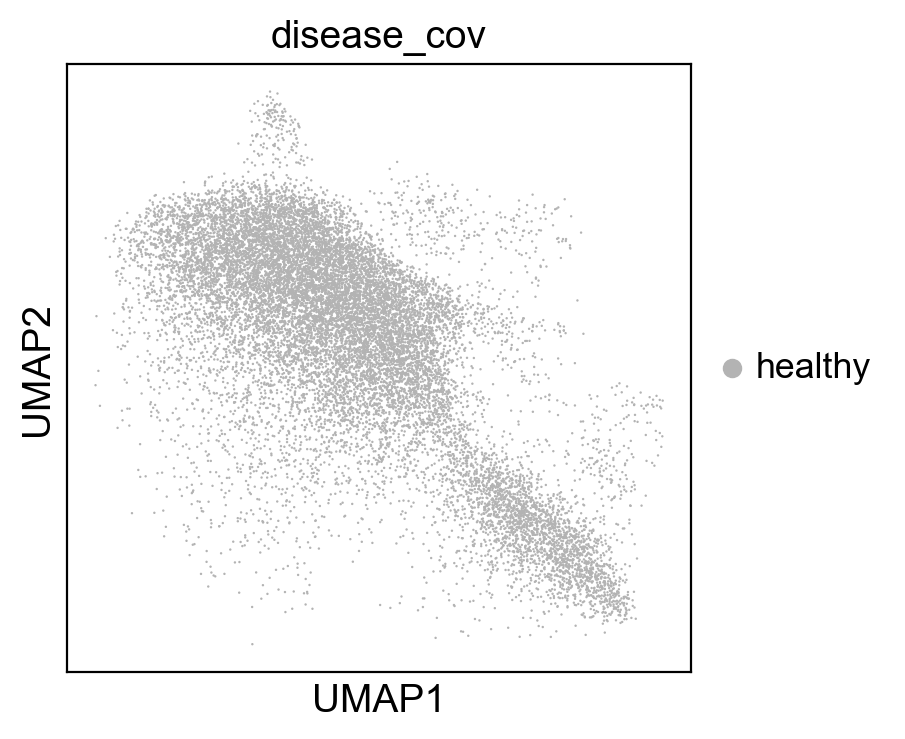

In [24]:
sc.pl.umap(adata[(adata.obs.batch_cov.str.contains("lupus")) & (adata.obs.disease_cov=="healthy")], color='disease_cov', size=3, edgecolor="none")

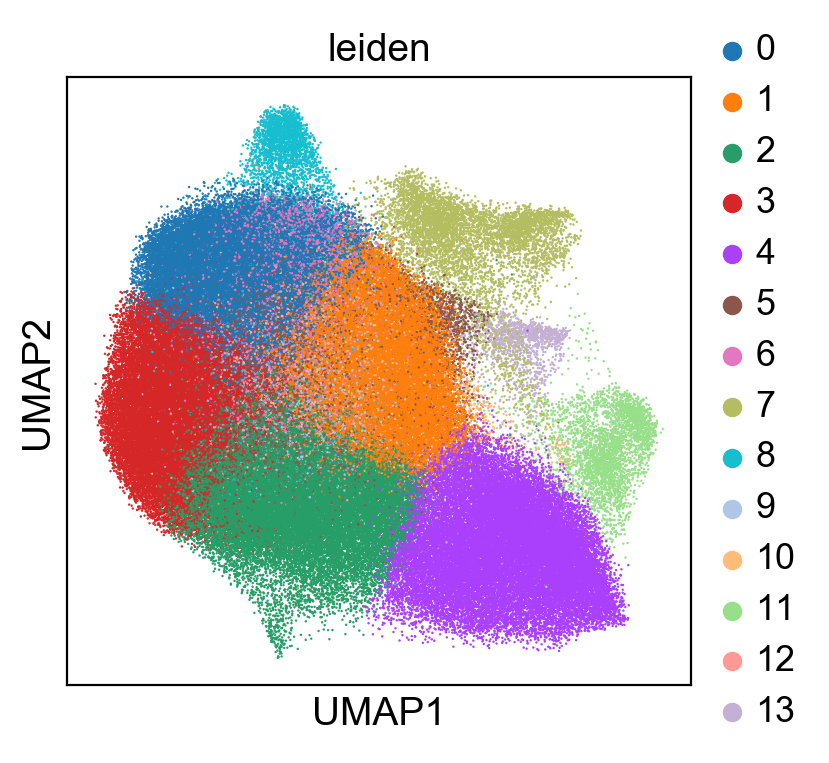

In [30]:
adata.uns['leiden_colors'] = sc.pl.palettes.vega_20_scanpy;
sc.pl.umap(adata, color='leiden', size=3)

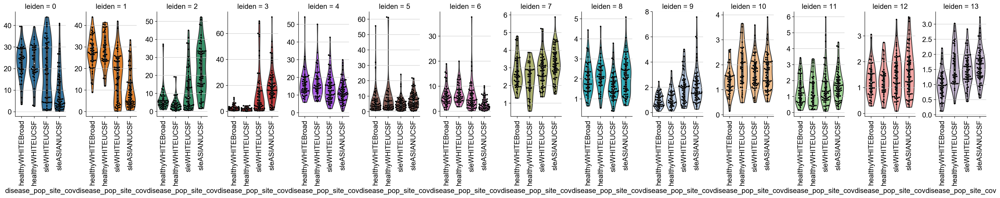

In [31]:
ct_counts=adata.obs.groupby(['ind_cov', 'pop_cov', 'disease_cov', 'batch_cov', 'disease_pop_cov','leiden'])['leiden'].count()

##ind_count = ind_count.reset_index(name="counts")
ct_counts_sums = ct_counts.groupby(["ind_cov","batch_cov"]).sum()
ct_counts_sums = ct_counts_sums.reset_index(name="counts")

ct_percs = ct_counts/ct_counts.groupby(["ind_cov","batch_cov"]).transform(sum)*100
ct_percs = ct_percs.reset_index(name='ct_percs')

ct_percs.ind_cov = ct_percs.ind_cov.apply(lambda x: x.split('_')[0])
ct_percs.ind_cov = ct_percs.ind_cov.astype("str")
ct_percs.reset_index(inplace=True)
ct_percs.leiden = ct_percs.leiden.astype("category")
ct_df=ct_percs.unstack(level=2, fill_value=0)

ct_percs['site'] = pd.Categorical(ct_percs.disease_cov, categories=['Broad','UCSF'])
ct_percs.site[ct_percs.batch_cov.str.contains("immvar")] = "Broad"
ct_percs.site[~ct_percs.batch_cov.str.contains("immvar")] = "UCSF"

ct_percs['disease_pop_site_cov'] = pd.Categorical(ct_percs.apply(lambda row: row['disease_cov'] + row['pop_cov'] + row['site'], axis=1),
                                             categories=['healthyWHITEBroad','healthyWHITEUCSF','sleWHITEUCSF','sleASIANUCSF'],
                                             ordered=True)


##plt.figure(figsize=(20,8))
plot=sb.catplot(x='disease_pop_site_cov', y='ct_percs', hue='leiden', data=ct_percs, kind='violin', col='leiden', dodge=False, aspect=0.5, height=4, sharex=False, sharey=False, palette=adata.uns['leiden_colors'], cut=0) #, palette=sc.pl.palettes.vega_20_scanpy
plot.set_xticklabels(rotation=90)
plot.fig.subplots_adjust(wspace=0.4)

for ct_i in list(range(len(ct_percs.leiden.cat.categories))) :
    ct = ct_percs.leiden.cat.categories[ct_i]
    sb.swarmplot(x="disease_pop_site_cov", y="ct_percs", data=ct_percs[ct_percs.leiden == ct], color="0", size=3, ax=plot.axes[0,ct_i])
    plot.axes[0,ct_i].get_yaxis().label.set_visible(False)

#plot.savefig(figdir+"/violin.cd4_pop.png")
#plt.subplots_adjust(wspace=0.03)

# Now let's plot differences in cluster proportion for ALL samples including UCSF and Broad ImmVar

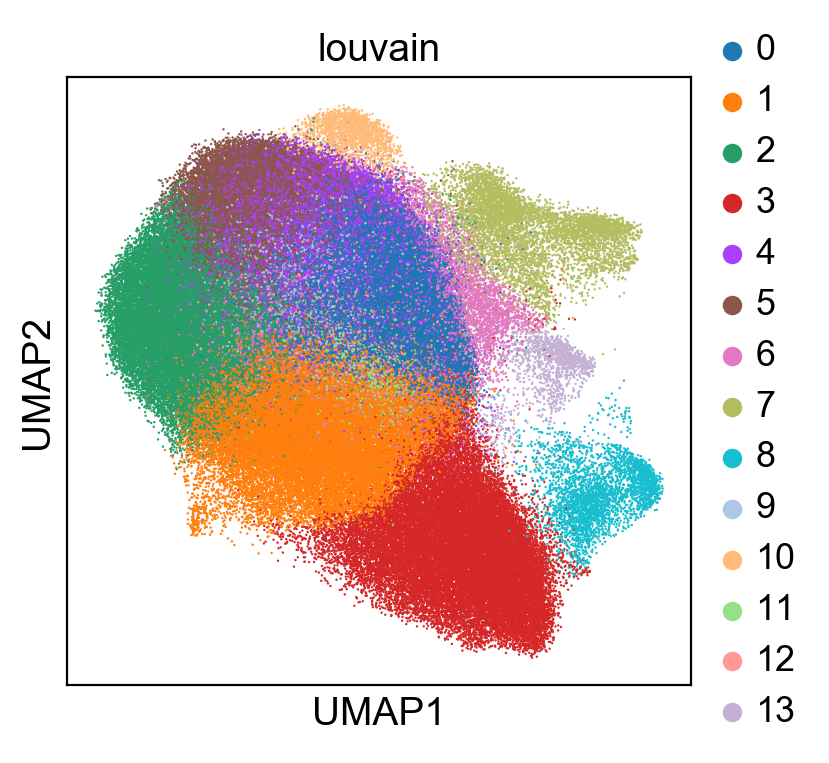

In [14]:
adata.uns['louvain_colors'] = sc.pl.palettes.vega_20_scanpy;
sc.pl.umap(adata, color='louvain', size=3)

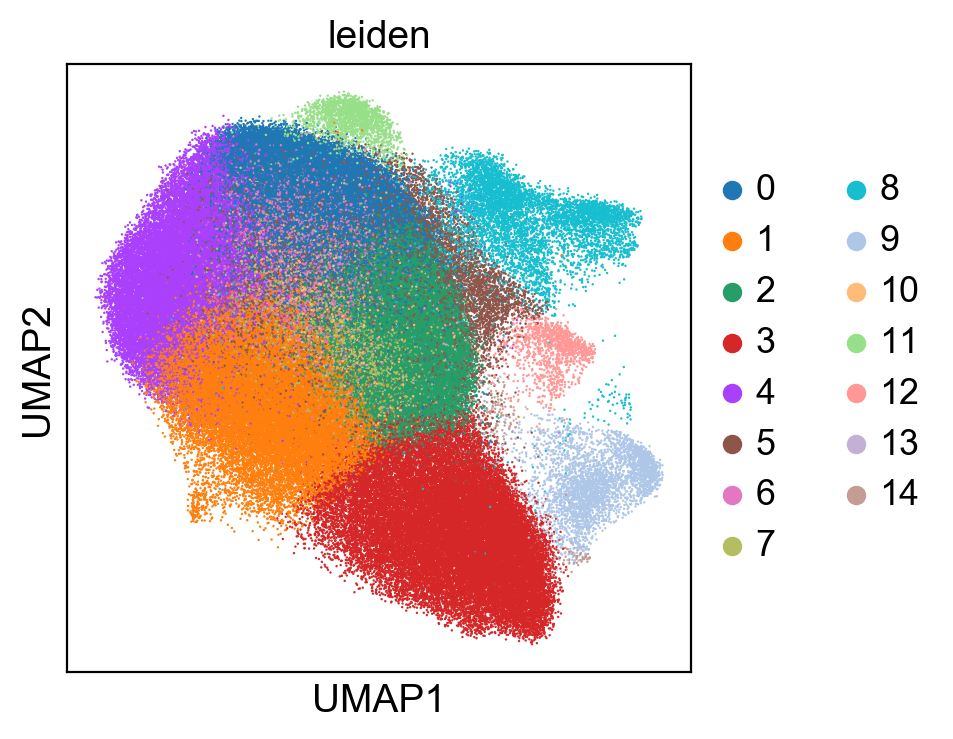

In [15]:
adata.uns['leiden_colors'] = sc.pl.palettes.vega_20_scanpy;
sc.pl.umap(adata, color='leiden', size=3)

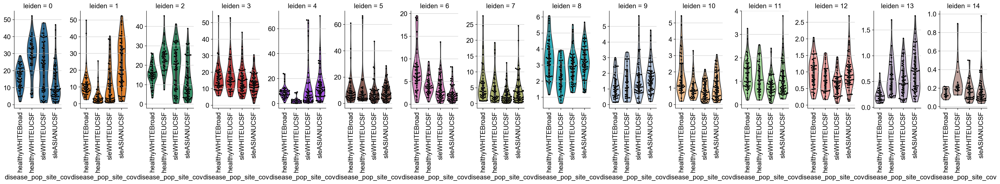

In [16]:
ct_counts=adata.obs.groupby(['ind_cov', 'pop_cov', 'disease_cov', 'batch_cov', 'disease_pop_cov','leiden'])['leiden'].count()

##ind_count = ind_count.reset_index(name="counts")
ct_counts_sums = ct_counts.groupby(["ind_cov","batch_cov"]).sum()
ct_counts_sums = ct_counts_sums.reset_index(name="counts")

ct_percs = ct_counts/ct_counts.groupby(["ind_cov","batch_cov"]).transform(sum)*100
ct_percs = ct_percs.reset_index(name='ct_percs')

ct_percs.ind_cov = ct_percs.ind_cov.apply(lambda x: x.split('_')[0])
ct_percs.ind_cov = ct_percs.ind_cov.astype("str")
ct_percs.reset_index(inplace=True)
ct_percs.leiden = ct_percs.leiden.astype("category")
ct_df=ct_percs.unstack(level=2, fill_value=0)

ct_percs['site'] = pd.Categorical(ct_percs.disease_cov, categories=['Broad','UCSF'])
ct_percs.site[ct_percs.batch_cov.str.contains("immvar")] = "Broad"
ct_percs.site[~ct_percs.batch_cov.str.contains("immvar")] = "UCSF"

ct_percs['disease_pop_site_cov'] = pd.Categorical(ct_percs.apply(lambda row: row['disease_cov'] + row['pop_cov'] + row['site'], axis=1),
                                             categories=['healthyWHITEBroad','healthyWHITEUCSF','sleWHITEUCSF','sleASIANUCSF'],
                                             ordered=True)


##plt.figure(figsize=(20,8))
plot=sb.catplot(x='disease_pop_site_cov', y='ct_percs', hue='leiden', data=ct_percs, kind='violin', col='leiden', dodge=False, aspect=0.5, height=4, sharex=False, sharey=False, palette=adata.uns['leiden_colors'], cut=0) #, palette=sc.pl.palettes.vega_20_scanpy
plot.set_xticklabels(rotation=90)
plot.fig.subplots_adjust(wspace=0.4)

for ct_i in list(range(len(ct_percs.leiden.cat.categories))) :
    ct = ct_percs.leiden.cat.categories[ct_i]
    sb.swarmplot(x="disease_pop_site_cov", y="ct_percs", data=ct_percs[ct_percs.leiden == ct], color="0", size=3, ax=plot.axes[0,ct_i])
    plot.axes[0,ct_i].get_yaxis().label.set_visible(False)

#plot.savefig(figdir+"/violin.cd4_pop.png")
#plt.subplots_adjust(wspace=0.03)

In [17]:
adata.obs['ct_cov'] = adata.obs['batch_cov'].astype('object')
## do some manual cell type assignment
adata.obs.loc[adata.obs.leiden == "0","ct_cov"] = "cM" # CCR7, SOCS3-, TNF- CREM-
adata.obs.loc[adata.obs.leiden == "1","ct_cov"] = "activated iM"# CCR7-, GATA3, RORA, CD45+, IL7R, CREM+
adata.obs.loc[adata.obs.leiden == "2","ct_cov"] = "iM" # PRF1, CD8+, IL7R-
adata.obs.loc[adata.obs.leiden == "3","ct_cov"] = "ncM" ## is memory above # CD69+, CCR7+, SOCS3+ CREM+
adata.obs.loc[adata.obs.leiden == "4","ct_cov"] = "activated cM" # CCR7+, CD8+
adata.obs.loc[adata.obs.leiden == "5","ct_cov"] = "IL1B+"# CREM+ CD8+, IL7R+
adata.obs.loc[adata.obs.leiden == "6","ct_cov"] = "activated cM" # CCR7+, FOXP1+
adata.obs.loc[adata.obs.leiden == "7","ct_cov"] = "activated cM"# PRF1+, CD8-, IL7+, CREM-, 
adata.obs.loc[adata.obs.leiden == "8","ct_cov"] = "CD4+ Contam" # CCR7+ CD8-, S100A4- 
adata.obs.loc[adata.obs.leiden == "9","ct_cov"] = "Complement+" # IL2RA+, CTLA4+, FOXP3+
adata.obs.loc[adata.obs.leiden == "10","ct_cov"] = "activated cM" # IFN+, STAT1+
adata.obs.loc[adata.obs.leiden == "11","ct_cov"] = "activated cM" # Platelet markers
adata.obs.loc[adata.obs.leiden == "12","ct_cov"] = "B" # STMN1+ SOX4+
adata.obs.loc[adata.obs.leiden == "13","ct_cov"] = "platelet" # PTCRA+
adata.obs.loc[adata.obs.leiden == "14","ct_cov"] = "platelet" # MNDA, CD14, FCER1G
adata.obs['ct_cov'] = adata.obs['ct_cov'].astype('category')

(2030, 10)
(206, 3)
(1865, 10)
(188, 3)


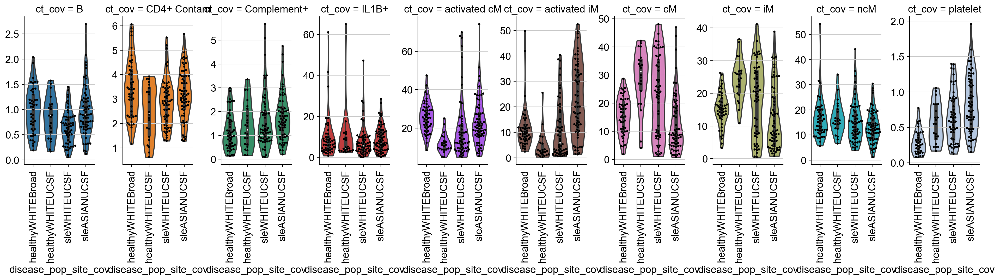

In [18]:
ct_counts=adata.obs.groupby(['ind_cov', 'pop_cov', 'disease_cov', 'batch_cov', 'disease_pop_cov','ct_cov'])['ct_cov'].count()

##ind_count = ind_count.reset_index(name="counts")
ct_counts_sums = ct_counts.groupby(["ind_cov","batch_cov"]).sum()
ct_counts_sums = ct_counts_sums.reset_index(name="counts")

ct_percs = ct_counts/ct_counts.groupby(["ind_cov","batch_cov"]).transform(sum)*100
ct_percs = ct_percs.reset_index(name='ct_percs')

ct_percs.ind_cov = ct_percs.ind_cov.apply(lambda x: x.split('_')[0])
ct_percs.ind_cov = ct_percs.ind_cov.astype("str")
ct_percs.reset_index(inplace=True)
ct_percs.ct_cov = ct_percs.ct_cov.astype("category")
ct_df=ct_percs.unstack(level=2, fill_value=0)

ct_percs['site'] = pd.Categorical(ct_percs.disease_cov, categories=['Broad','UCSF'])
ct_percs.site[ct_percs.batch_cov.str.contains("immvar")] = "Broad"
ct_percs.site[~ct_percs.batch_cov.str.contains("immvar")] = "UCSF"

ct_percs['disease_pop_site_cov'] = pd.Categorical(ct_percs.apply(lambda row: row['disease_cov'] + row['pop_cov'] + row['site'], axis=1),
                                             categories=['healthyWHITEBroad','healthyWHITEUCSF','sleWHITEUCSF','sleASIANUCSF'],
                                             ordered=True)



print(ct_percs.shape)
print(ct_counts_sums.shape)

## for now, let's filter out one of the reps for the healthies from UCSF only
ct_percs_broad = ct_percs[~ct_percs.batch_cov.str.contains("lupus")]
ct_percs_ucsf = ct_percs[ct_percs.batch_cov.str.contains("lupus")].drop_duplicates(subset=['ct_cov','ind_cov'])
ct_percs = ct_percs_ucsf.append(ct_percs_broad);

ct_counts_sums_broad = ct_counts_sums[~ct_counts_sums.batch_cov.str.contains("lupus")]
ct_counts_sums_ucsf = ct_counts_sums[ct_counts_sums.batch_cov.str.contains("lupus")].drop_duplicates(subset=['ind_cov'])
ct_counts_sums = ct_counts_sums_ucsf.append(ct_counts_sums_broad);

print(ct_percs.shape)
print(ct_counts_sums.shape)

##plt.figure(figsize=(20,8))
plot=sb.catplot(x='disease_pop_site_cov', y='ct_percs', hue='ct_cov', data=ct_percs, kind='violin', col='ct_cov', dodge=False, aspect=0.5, height=4, sharex=False, sharey=False, palette=adata.uns['leiden_colors'], cut=0) #, palette=sc.pl.palettes.vega_20_scanpy
plot.set_xticklabels(rotation=90)
plot.fig.subplots_adjust(wspace=0.4)

for ct_i in list(range(len(ct_percs.ct_cov.cat.categories))) :
    ct = ct_percs.ct_cov.cat.categories[ct_i]
    sb.swarmplot(x="disease_pop_site_cov", y="ct_percs", data=ct_percs[ct_percs.ct_cov == ct], color="0", size=3, ax=plot.axes[0,ct_i])
    plot.axes[0,ct_i].get_yaxis().label.set_visible(False)

#plot.savefig(figdir+"/violin.cd4_pop.png")
#plt.subplots_adjust(wspace=0.03)

In [19]:
adata = adata[~adata.obs.leiden.isin(["8","12","13"])].copy() ## T cell doublets, B cell doublets and platelet contam

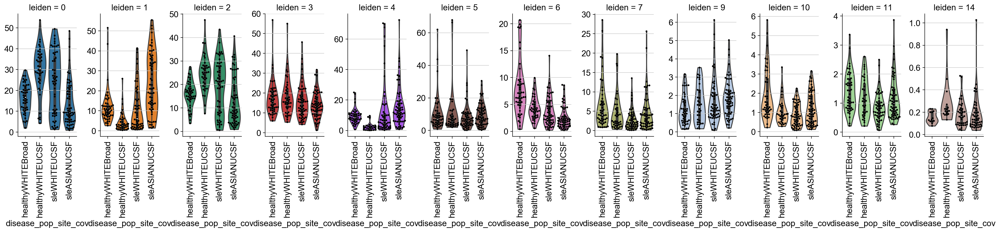

In [20]:
ct_counts=adata.obs.groupby(['ind_cov', 'pop_cov', 'disease_cov', 'batch_cov', 'disease_pop_cov','leiden'])['leiden'].count()

##ind_count = ind_count.reset_index(name="counts")
ct_counts_sums = ct_counts.groupby(["ind_cov","batch_cov"]).sum()
ct_counts_sums = ct_counts_sums.reset_index(name="counts")

ct_percs = ct_counts/ct_counts.groupby(["ind_cov","batch_cov"]).transform(sum)*100
ct_percs = ct_percs.reset_index(name='ct_percs')

ct_percs.ind_cov = ct_percs.ind_cov.apply(lambda x: x.split('_')[0])
ct_percs.ind_cov = ct_percs.ind_cov.astype("str")
ct_percs.reset_index(inplace=True)
ct_percs.leiden = ct_percs.leiden.astype("category")
ct_df=ct_percs.unstack(level=2, fill_value=0)

ct_percs['site'] = pd.Categorical(ct_percs.disease_cov, categories=['Broad','UCSF'])
ct_percs.site[ct_percs.batch_cov.str.contains("immvar")] = "Broad"
ct_percs.site[~ct_percs.batch_cov.str.contains("immvar")] = "UCSF"

ct_percs['disease_pop_site_cov'] = pd.Categorical(ct_percs.apply(lambda row: row['disease_cov'] + row['pop_cov'] + row['site'], axis=1),
                                             categories=['healthyWHITEBroad','healthyWHITEUCSF','sleWHITEUCSF','sleASIANUCSF'],
                                             ordered=True)


##plt.figure(figsize=(20,8))
plot=sb.catplot(x='disease_pop_site_cov', y='ct_percs', hue='leiden', data=ct_percs, kind='violin', col='leiden', dodge=False, aspect=0.5, height=4, sharex=False, sharey=False, palette=adata.uns['leiden_colors'], cut=0) #, palette=sc.pl.palettes.vega_20_scanpy
plot.set_xticklabels(rotation=90)
plot.fig.subplots_adjust(wspace=0.4)

for ct_i in list(range(len(ct_percs.leiden.cat.categories))) :
    ct = ct_percs.leiden.cat.categories[ct_i]
    sb.swarmplot(x="disease_pop_site_cov", y="ct_percs", data=ct_percs[ct_percs.leiden == ct], color="0", size=3, ax=plot.axes[0,ct_i])
    plot.axes[0,ct_i].get_yaxis().label.set_visible(False)

#plot.savefig(figdir+"/violin.cd4_pop.png")
#plt.subplots_adjust(wspace=0.03)

(1551, 10)
(206, 3)
(1428, 10)
(188, 3)


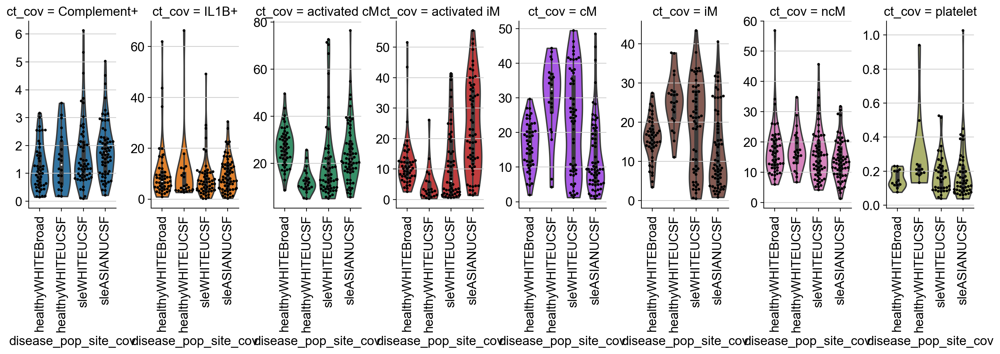

In [21]:
ct_counts=adata.obs.groupby(['ind_cov', 'pop_cov', 'disease_cov', 'batch_cov', 'disease_pop_cov','ct_cov'])['ct_cov'].count()

##ind_count = ind_count.reset_index(name="counts")
ct_counts_sums = ct_counts.groupby(["ind_cov","batch_cov"]).sum()
ct_counts_sums = ct_counts_sums.reset_index(name="counts")

ct_percs = ct_counts/ct_counts.groupby(["ind_cov","batch_cov"]).transform(sum)*100
ct_percs = ct_percs.reset_index(name='ct_percs')

ct_percs.ind_cov = ct_percs.ind_cov.apply(lambda x: x.split('_')[0])
ct_percs.ind_cov = ct_percs.ind_cov.astype("str")
ct_percs.reset_index(inplace=True)
ct_percs.ct_cov = ct_percs.ct_cov.astype("category")
ct_df=ct_percs.unstack(level=2, fill_value=0)

ct_percs['site'] = pd.Categorical(ct_percs.disease_cov, categories=['Broad','UCSF'])
ct_percs.site[ct_percs.batch_cov.str.contains("immvar")] = "Broad"
ct_percs.site[~ct_percs.batch_cov.str.contains("immvar")] = "UCSF"

ct_percs['disease_pop_site_cov'] = pd.Categorical(ct_percs.apply(lambda row: row['disease_cov'] + row['pop_cov'] + row['site'], axis=1),
                                             categories=['healthyWHITEBroad','healthyWHITEUCSF','sleWHITEUCSF','sleASIANUCSF'],
                                             ordered=True)



print(ct_percs.shape)
print(ct_counts_sums.shape)

## for now, let's filter out one of the reps for the healthies from UCSF only
ct_percs_broad = ct_percs[~ct_percs.batch_cov.str.contains("lupus")]
ct_percs_ucsf = ct_percs[ct_percs.batch_cov.str.contains("lupus")].drop_duplicates(subset=['ct_cov','ind_cov'])
ct_percs = ct_percs_ucsf.append(ct_percs_broad);

ct_counts_sums_broad = ct_counts_sums[~ct_counts_sums.batch_cov.str.contains("lupus")]
ct_counts_sums_ucsf = ct_counts_sums[ct_counts_sums.batch_cov.str.contains("lupus")].drop_duplicates(subset=['ind_cov'])
ct_counts_sums = ct_counts_sums_ucsf.append(ct_counts_sums_broad);

print(ct_percs.shape)
print(ct_counts_sums.shape)

##plt.figure(figsize=(20,8))
plot=sb.catplot(x='disease_pop_site_cov', y='ct_percs', hue='ct_cov', data=ct_percs, kind='violin', col='ct_cov', dodge=False, aspect=0.5, height=4, sharex=False, sharey=False, palette=adata.uns['leiden_colors'], cut=0) #, palette=sc.pl.palettes.vega_20_scanpy
plot.set_xticklabels(rotation=90)
plot.fig.subplots_adjust(wspace=0.4)

for ct_i in list(range(len(ct_percs.ct_cov.cat.categories))) :
    ct = ct_percs.ct_cov.cat.categories[ct_i]
    sb.swarmplot(x="disease_pop_site_cov", y="ct_percs", data=ct_percs[ct_percs.ct_cov == ct], color="0", size=3, ax=plot.axes[0,ct_i])
    plot.axes[0,ct_i].get_yaxis().label.set_visible(False)

#plot.savefig(figdir+"/violin.cd4_pop.png")
#plt.subplots_adjust(wspace=0.03)

# Let's look at the data in UMAP space

## And of course UMAP with the louvain clusters highlighted

In [22]:
adata = adata[~adata.obs.leiden.isin(["8","12","13"])].copy() ## T cell doublets, B cell doublets and platelet contam

In [23]:
## just filter for the UCSF samples
adata = adata[adata.obs.Broad == 0]
adata.shape

(176620, 1495)

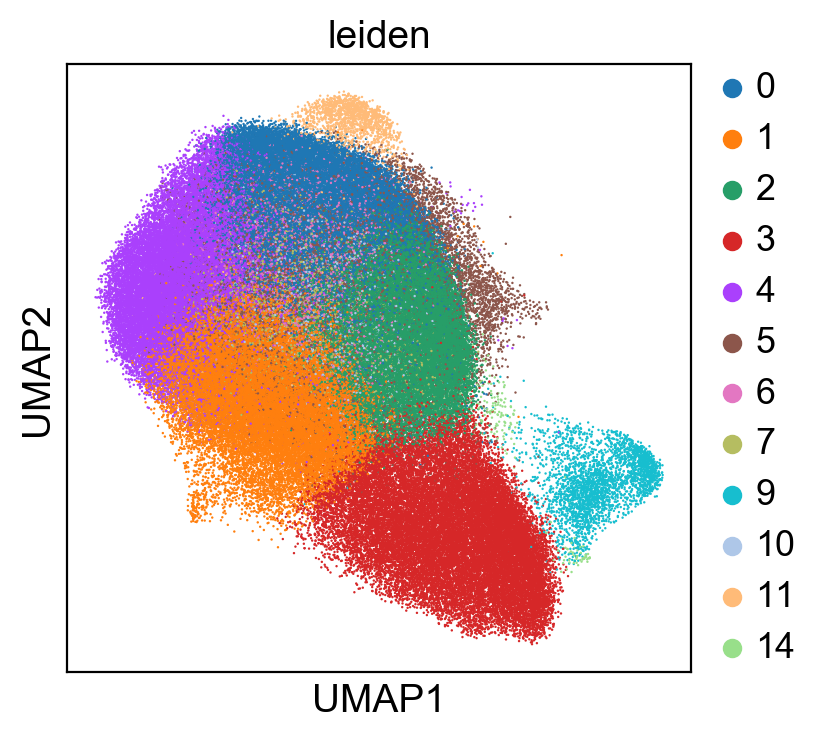

In [24]:
adata.uns['leiden_colors'] = sc.pl.palettes.vega_20_scanpy;
sc.pl.umap(adata, color='leiden', size=3)

In [25]:
# adata = adata[adata.obs.leiden != "8"] ## T cell doublets
# adata = adata[adata.obs.leiden != "12"] ## B cell doublets
# adata = adata[adata.obs.leiden != "13"] ## platelet contam

ranking genes
    finished (0:00:16.86)


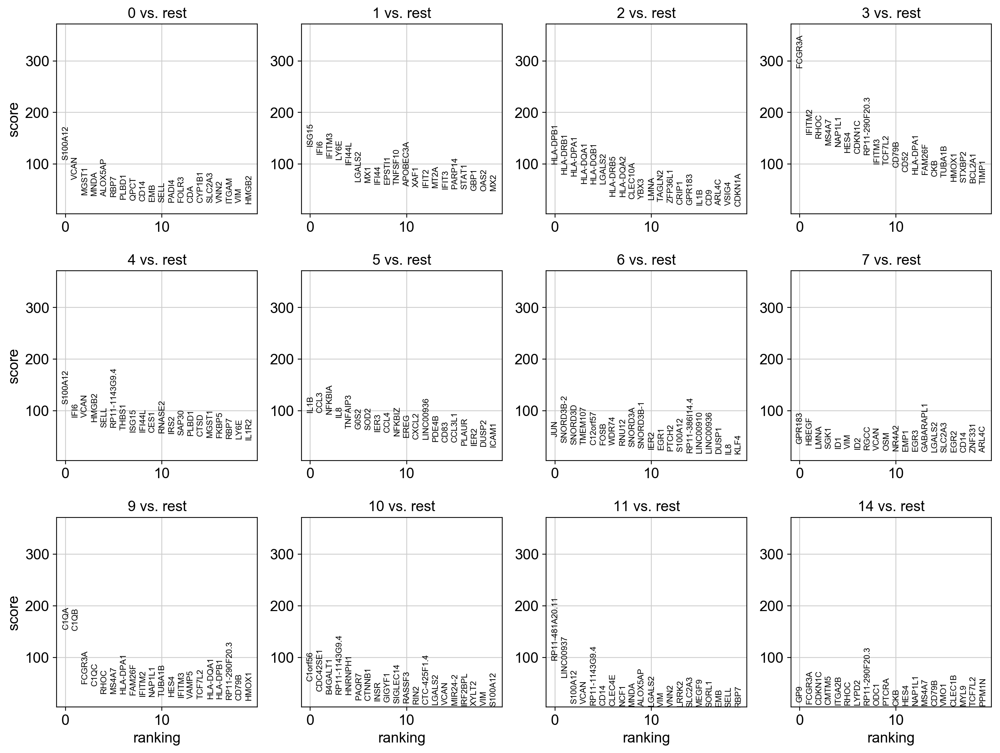

In [26]:
sc.tl.rank_genes_groups(adata, n_genes=20, groupby='leiden', use_raw=False)
sc.pl.rank_genes_groups(adata)

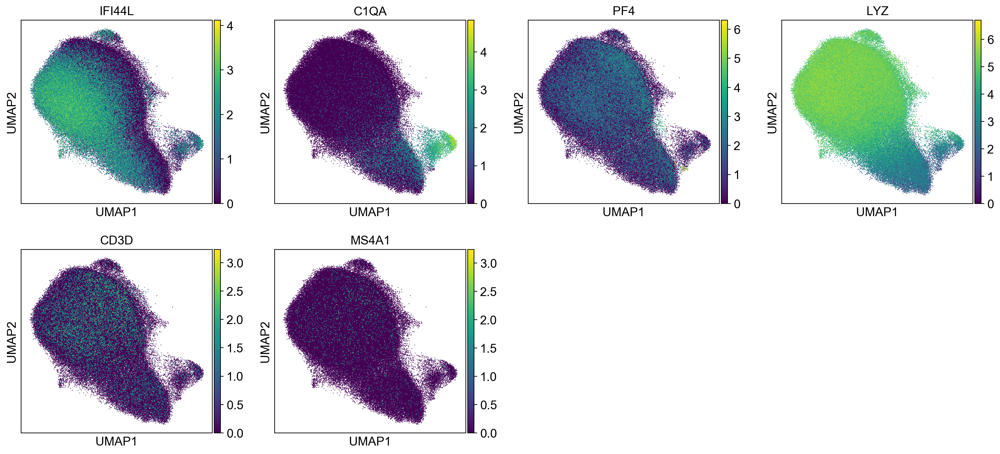

In [27]:
sc.pl.umap(adata, color=['IFI44L','C1QA','PF4','LYZ','CD3D','MS4A1'], size=3)

saving figure to file ./figures.V5.1/umap.leiden.all.png


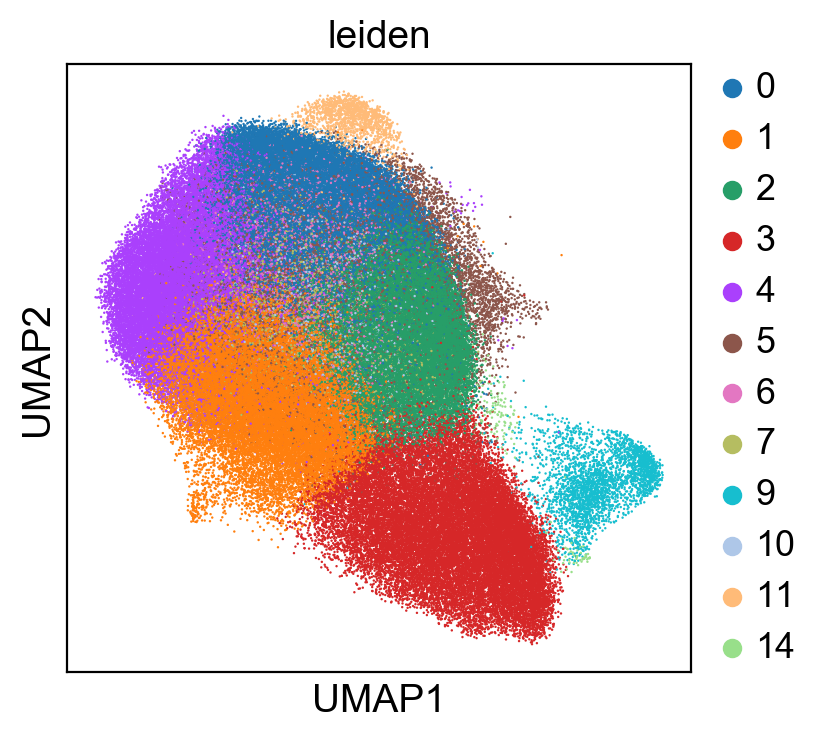

In [28]:
sc.pl.umap(adata, color='leiden', size=3)
sc.pl.umap(adata, color='leiden', size=3, save=".leiden.all.png")

saving figure to file ./figures.V5.1/umap.disease.png


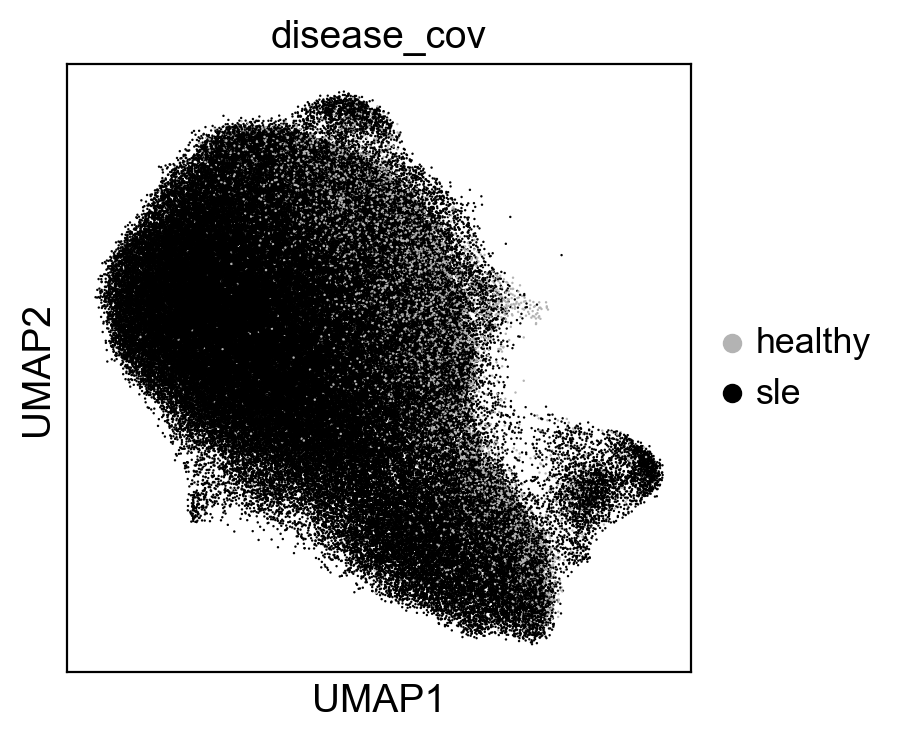

In [29]:
adata.obs.disease_cov.cat.reorder_categories(["healthy","sle"],inplace=True)
sc.pl.umap(adata, color='disease_cov', size=3,  palette=['#B3B3B3','#000000'])
sc.pl.umap(adata, color='disease_cov', size=3,  palette=['#B3B3B3','#000000'], save=".disease.png")

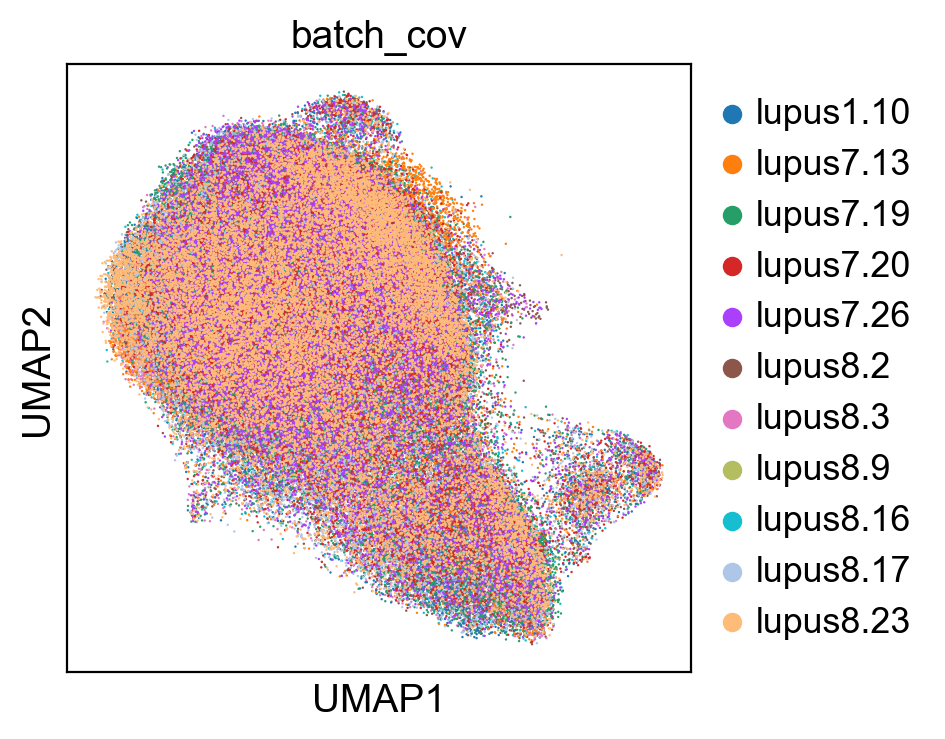

In [30]:
sc.pl.umap(adata, color=["batch_cov"], size=3)

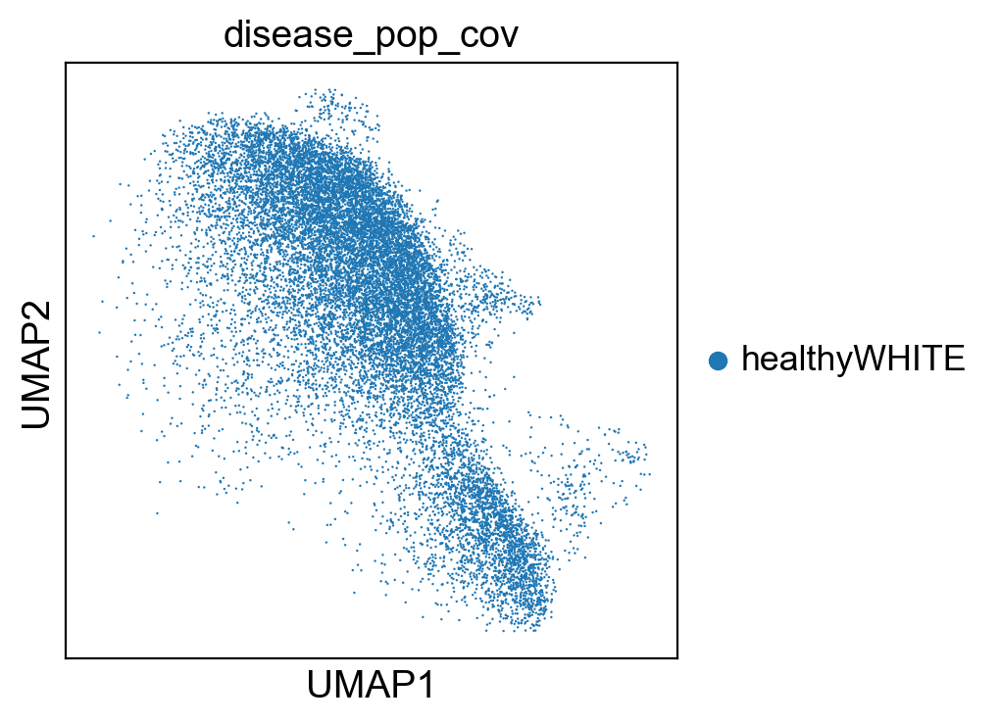

In [31]:
sc.pl.umap(adata[adata.obs.disease_pop_cov == "healthyWHITE"], color=["disease_pop_cov"], size=3)

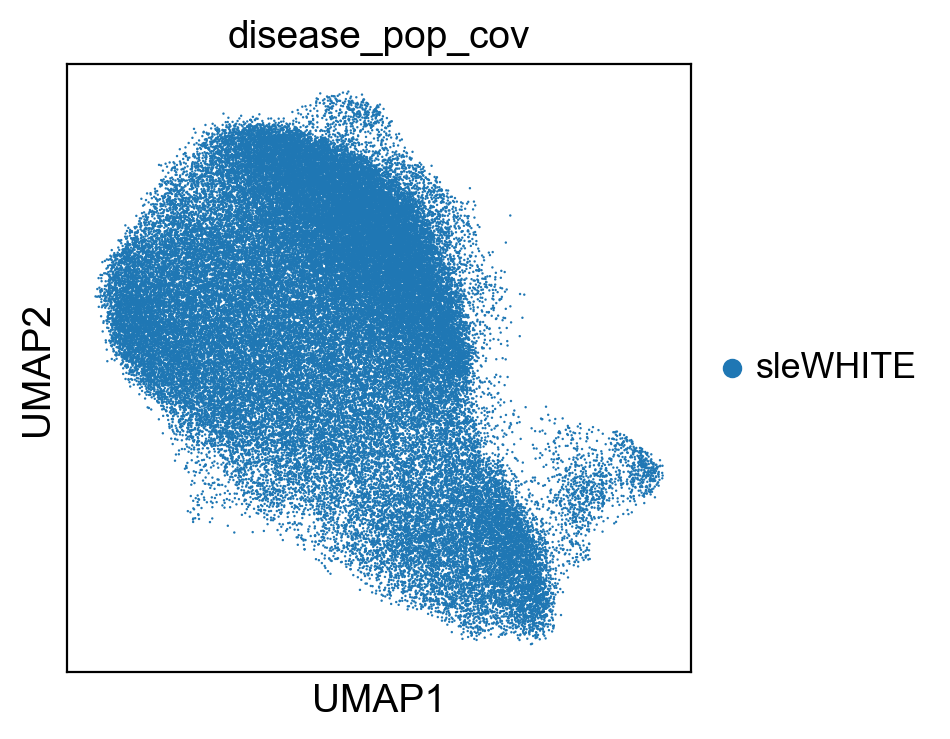

In [32]:
sc.pl.umap(adata[adata.obs.disease_pop_cov == "sleWHITE"], color=["disease_pop_cov"], size=3)

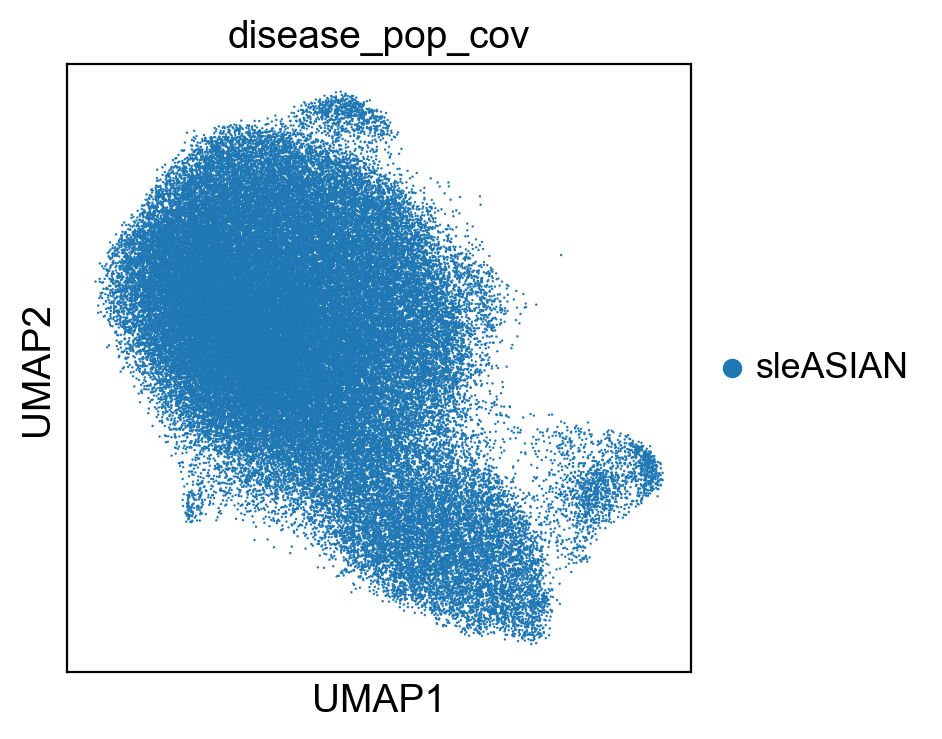

In [33]:
sc.pl.umap(adata[adata.obs.disease_pop_cov == "sleASIAN"], color=["disease_pop_cov"], size=3)

In [34]:
# #plot UMAP of cell types colored by clusters
# sc.tl.umap(adata)
# sc.pl.umap(adata, color='louvain', size=3)

In [35]:
# adata2 = sc.read("/Users/yechun/Downloads/CLUESImmVar_processed.V3.h5ad")
# for i in range(0,13) :
#     print(i,end=":")
#     print(len(adata.obs.index[adata.obs.louvain==str(i)]& adata2.obs.index)/len(adata.obs.index[adata.obs.louvain==str(i)]))

In [36]:
# sc.pp.regress_out(adata, ['batch_cov'])

# Now let's plot differences in cluster proportion

as a proportion of cell type
Cluster type:0
Beta=11.83022677267912, pvalue=0.0001583942399280013
Cluster type:1
Beta=-14.278699473663032, pvalue=1.3859116792426335e-05
Cluster type:2
Beta=9.576305455335238, pvalue=0.00015082780306445329
Cluster type:3
Beta=3.012910636257063, pvalue=0.10199551769013208
Cluster type:4
Beta=-12.205612644817396, pvalue=0.0004966942270136063
Cluster type:5
Beta=0.6972709089117097, pvalue=0.7307097192028529
Cluster type:6
Beta=1.4864406217079824, pvalue=0.0075857984964880195
Cluster type:7
Beta=0.5550260112497243, pvalue=0.5555436463780461
Cluster type:9
Beta=-0.44009107844492557, pvalue=0.089427578619125
Cluster type:10
Beta=-0.10851401246792616, pvalue=0.5218603649204503
Cluster type:11
Beta=0.00912988531737148, pvalue=0.9512726567271549
Cluster type:14
Beta=0.008802588347979413, pvalue=0.8355811072312521


/Users/yimmieg/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2223: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


<Figure size 1500x800 with 0 Axes>

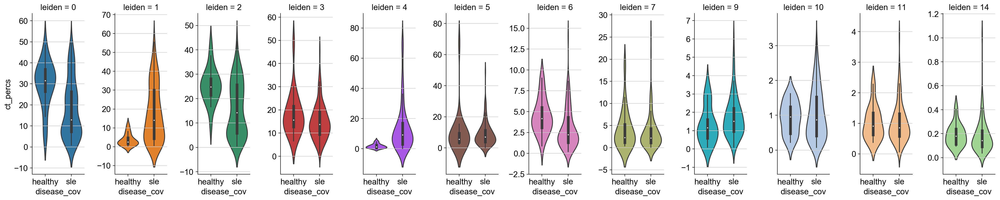

In [37]:
#get counts of cells for each cluster
ct_counts=adata.obs.groupby(['ind_cov', 'disease_cov','leiden'])['leiden'].count()
ct_percs = ct_counts/ct_counts.groupby(level=[0]).transform(sum)*100
ct_percs = ct_percs.reset_index(name='ct_percs')
ct_percs.ind_cov = ct_percs.ind_cov.apply(lambda x: x.split('_')[0])
ct_percs.ind_cov = ct_percs.ind_cov.astype("str")
ct_percs.reset_index(inplace=True)
ct_percs.leiden = ct_percs.leiden.astype("category")
ct_df=ct_percs.unstack(level=2, fill_value=0)

##n_cts=ct_df.shape[1]-1
print('as a proportion of cell type')
for ct_i in list(range(0,len(adata.obs.leiden.cat.categories))) :
    ct = ct_percs.leiden.cat.categories[ct_i]
    ct_perc = ct_percs.ct_percs[ct_percs.leiden==ct]
    disease = ct_percs.disease_cov[ct_percs.leiden==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    print('Cluster type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Beta='+str(effect)+', pvalue='+str(pval))

# #box plot as a proportion of cell type
# vars=[str(x) for x in list(range(n_cts))]
# ct_df['ind_cov']=ct_df.index.get_level_values('ind_cov').tolist()
# ct_df.index=ct_df['ind_cov']
# melted=pd.melt(ct_df, id_vars=['ind_cov', 'disease'], value_vars=vars)

#plot=sb.boxplot(x='disease', y='value', hue=ct_arg, data=melted).get_figure()
plt.figure(figsize=(15,8))
plot=sb.catplot(x='disease_cov', y='ct_percs', hue='leiden', data=ct_percs, kind='violin', col='leiden', dodge=False, aspect=0.4, sharex=False, sharey=False, palette=sc.pl.palettes.vega_20_scanpy)
plot.savefig(figdir+"/violin.ct_cov.png")
#plt.subplots_adjust(wspace=0.03)

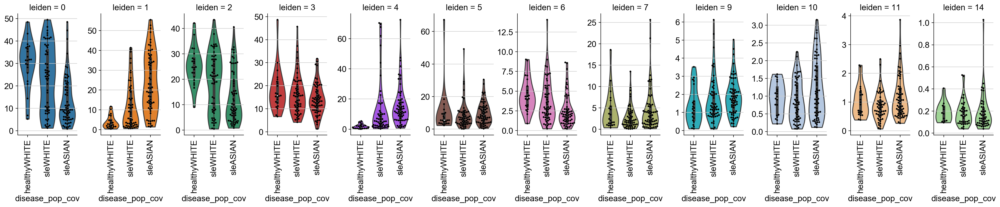

In [38]:
#get counts of cells for each cluster
ct_counts=adata.obs.groupby(['ind_cov', 'disease_cov', 'disease_pop_cov','leiden'])['leiden'].count()
ct_percs = ct_counts/ct_counts.groupby(level=[0]).transform(sum)*100
ct_percs = ct_percs.reset_index(name='ct_percs')
ct_percs.ind_cov = ct_percs.ind_cov.apply(lambda x: x.split('_')[0])
ct_percs.ind_cov = ct_percs.ind_cov.astype("str")
ct_percs.reset_index(inplace=True)
ct_percs.leiden = ct_percs.leiden.astype("category")
ct_df=ct_percs.unstack(level=2, fill_value=0)

##plt.figure(figsize=(20,8))
plot=sb.catplot(x='disease_pop_cov', y='ct_percs', hue='leiden', data=ct_percs, kind='violin', col='leiden', dodge=False, aspect=0.5, height=4, sharex=False, sharey=False, palette=sc.pl.palettes.vega_20_scanpy, cut=0)
plot.set_xticklabels(rotation=90)
plot.fig.subplots_adjust(wspace=0.4)

for ct_i in list(range(len(ct_percs.leiden.cat.categories))) :
    ct = ct_percs.leiden.cat.categories[ct_i]
    sb.swarmplot(x="disease_pop_cov", y="ct_percs", data=ct_percs[ct_percs.leiden == ct], color="0", size=3, ax=plot.axes[0,ct_i])
    plot.axes[0,ct_i].get_yaxis().label.set_visible(False)

plot.savefig(figdir+"/violin.ct_cov_pop.png")
#plt.subplots_adjust(wspace=0.03)

# Let's also plot the absolutely abundance of each cluster

In [39]:
## Let's grab the clinical and labs data and compare to our single cell estimates
clues_clinical = pd.read_table("v2.clinical.data.txt", index_col=False)
clues_clinical.genotypeid = clues_clinical.genotypeid.apply(lambda x: x.split('_')[0])
clues_clinical.subjectid = clues_clinical.subjectid.astype("str")
joined = ct_percs.join(clues_clinical.set_index('genotypeid'), on='ind_cov')

t1_labs = pd.read_table("T1labs.csv",sep=",")
t1_labs.SubjectID = t1_labs.SubjectID.astype("str")
joined = joined.join(t1_labs.set_index('SubjectID'), on='subjectid')

### test new code
joined.AbsBaso = joined.AbsBaso/1000
joined.AbsEosino = joined.AbsEosino/1000
joined.AbsLympho = joined.AbsLympho/1000
joined.AbsNeutro = joined.AbsNeutro/1000
joined.AbsMono = joined.AbsMono/1000

joined = joined.assign(pbmc = joined.WhiteBloodCell-joined.AbsNeutro-joined.AbsEosino-joined.AbsBaso)

joined[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(str)

## now let's add in white blood cell counts for the immvar patients
immvar_pbmc = pd.read_table("immvar.pbmc.csv", index_col=False, sep=",")
immvar_pbmc.pbmc = immvar_pbmc.pbmc - (np.mean(immvar_pbmc.pbmc) - np.mean(joined.pbmc))

## this is not the most efficient code but will suffice for now
for i in list(range(12)) :
    igtb = immvar_pbmc.immvarid[i]
    joined.pbmc[joined.ind_cov==igtb] = immvar_pbmc.pbmc[i]

joined = joined.assign(estimate=joined.ct_percs/100*joined.pbmc)

joined[["ind_cov","disease_cov","leiden"]] = joined[["ind_cov","disease_cov","leiden"]].astype(str)
joined.plaquenilnow = joined.plaquenilnow.fillna(0)
joined.cellceptnow = joined.cellceptnow.fillna(0)
joined.steroralnow = joined.steroralnow.fillna(0)
joined.acrlymphopenia = joined.acrlymphopenia.fillna(0)

joined_pivot = joined.pivot_table(index=['ind_cov',"disease_cov","pbmc","plaquenilnow","cellceptnow","steroralnow","acrlymphopenia"], columns="leiden", values="estimate")
joined_pivot.reset_index(inplace=True)
joined_pivot = joined_pivot[joined_pivot.pbmc > 0]
joined_pivot.disease_cov = pd.Categorical(joined_pivot.disease_cov,categories=['healthy','sle'], ordered=True)

# joined_pivot_perc = joined.pivot_table(index=['ind_cov',"disease_cov","pbmc","plaquenilnow","cellceptnow","steroralnow","acrlymphopenia"], columns="leiden", values="ct_percs")
# joined_pivot_perc.reset_index(inplace=True)
# ##joined_pivot = joined_pivot[joined_pivot.pbmc > 0]
# joined_pivot.disease_cov = pd.Categorical(joined_pivot.disease_cov,categories=['healthy','sle'], ordered=True)

/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: read_table is deprecated, use read_csv instead, passing sep='\t'.
  
/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: FutureWarning: read_table is deprecated, use read_csv instead.
  import sys
/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:23: FutureWarning: read_table is deprecated, use read_csv instead.
/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


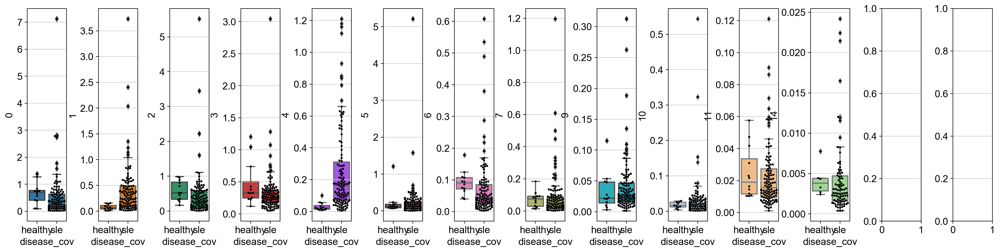

In [40]:
fig,ax = plt.subplots(nrows=1,ncols=len(adata.obs.louvain.cat.categories), figsize=(20,5))
fig.tight_layout()

for ct_i in list(range(0,len(adata.obs.leiden.cat.categories))):
    ct = ct_percs.leiden.cat.categories[ct_i]
    sb.boxplot(x="disease_cov", y=ct, data=joined_pivot, color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
    sb.swarmplot(x="disease_cov", y=ct, data=joined_pivot, color="0", size=3, ax=ax[ct_i])

# Let's look at the IFN score now

In [41]:
ifn = pd.read_table("v2.ifn.sig.txt", sep=" ", index_col=False)
ifn.name = ifn.name.apply(lambda x: x.split('_')[0])
joined2 = ifn.join(joined.set_index("ind_cov"), on="name")
joined_pivot2 = joined2.pivot_table(index=['name',"disease_cov","pbmc","ifn","plaquenilnow","cellceptnow","steroralnow","acrlymphopenia"], columns="leiden", values="estimate")
joined_pivot2.reset_index(inplace=True)

print(joined_pivot2[joined_pivot2.pbmc < 0])
joined_pivot2 = joined_pivot2[joined_pivot2.pbmc > 0]

print(joined_pivot2[joined_pivot2.pbmc > 10])
joined_pivot2 = joined_pivot2[joined_pivot2.pbmc < 10]

##n_cts=ct_df.shape[1]-1
print('as a proportion of cell type')
for ct_i in list(range(0,len(adata.obs.leiden.cat.categories))):
    ct = ct_percs.leiden.cat.categories[ct_i]
    ct_perc = joined_pivot2[ct]
    ifn = joined_pivot2.ifn
    ifn = sm.add_constant(ifn)
    print('Cluster type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), ifn.astype(float),missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Beta='+str(effect)+', pvalue='+str(pval))

    
# fig,ax = plt.subplots(nrows=1,ncols=len(adata.obs.leiden.cat.categories), figsize=(20,4))
# fig.tight_layout()

# for ct_i in list(range(0,len(adata.obs.leiden.cat.categories))):
#     ct = ct_percs.leiden.cat.categories[ct_i]
#     sb.scatterplot(x="ifn", y=ct, data=joined_pivot2, color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
#     ax[ct_i].get_yaxis().label.set_visible(False)
#     ##sb.swarmplot(x="disease_cov", y=ct, data=joined_pivot, color="0", size=3, ax=ax[ct_i])
    

leiden       name disease_cov   pbmc      ifn  plaquenilnow  cellceptnow  \
109     904049200         sle -8.083  4.11538           1.0          0.0   

leiden  steroralnow  acrlymphopenia         0         1        10        11  \
109             1.0             1.0 -0.705939 -1.016552 -0.063534 -0.070594   

leiden  14         2         3         4         5         6         7  \
109    NaN -0.317672 -1.658956 -3.557932 -0.331791 -0.077653 -0.127069   

leiden         9  
109    -0.155307  
leiden       name disease_cov    pbmc       ifn  plaquenilnow  cellceptnow  \
26           1326         sle  11.294  1.648588           1.0          1.0   
28           1334         sle  20.685 -1.838448           1.0          1.0   
84      900034200         sle  10.592 -3.865882           1.0          0.0   

leiden  steroralnow  acrlymphopenia         0         1        10        11  \
26              1.0             0.0  2.816772  1.228974  0.322942  0.121103   
28              1.0           

/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: read_table is deprecated, use read_csv instead.
  """Entry point for launching an IPython kernel.


In [42]:

joined_pivot2_percs = joined2.pivot_table(index=['name',"disease_cov","pbmc","ifn","plaquenilnow","cellceptnow","steroralnow","acrlymphopenia"], columns="leiden", values="ct_percs")
joined_pivot2_percs.reset_index(inplace=True)

print(joined_pivot2_percs[joined_pivot2_percs.pbmc < 0])
joined_pivot2_percs = joined_pivot2_percs[joined_pivot2_percs.pbmc > 0]

print(joined_pivot2_percs[joined_pivot2_percs.pbmc > 10])
joined_pivot2_percs = joined_pivot2_percs[joined_pivot2_percs.pbmc < 10]

##n_cts=ct_df.shape[1]-1
print('as a proportion of cell type')
for ct_i in list(range(0,len(adata.obs.leiden.cat.categories))):
    ct = ct_percs.leiden.cat.categories[ct_i]
    ct_perc = joined_pivot2_percs[ct]
    ifn = joined_pivot2_percs.ifn
    ifn = sm.add_constant(ifn)
    print('Cluster type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), ifn.astype(float),missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Beta='+str(effect)+', pvalue='+str(pval))

# fig,ax = plt.subplots(nrows=1,ncols=len(adata.obs.leiden.cat.categories), figsize=(20,4))
# fig.tight_layout()

    
# for ct_i in list(range(0,len(adata.obs.leiden.cat.categories))):
#     ct = ct_percs.leiden.cat.categories[ct_i]
#     sb.scatterplot(x="ifn", y=ct, data=joined_pivot2_percs, color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
#     ax[ct_i].get_yaxis().label.set_visible(False)
#     ##sb.swarmplot(x="disease_cov", y=ct, data=joined_pivot, color="0", size=3, ax=ax[ct_i])

    
# fig.savefig(figdir+"/ifn.ct_cov.png")



leiden       name disease_cov   pbmc      ifn  plaquenilnow  cellceptnow  \
109     904049200         sle -8.083  4.11538           1.0          0.0   

leiden  steroralnow  acrlymphopenia         0          1        10        11  \
109             1.0             1.0  8.733624  12.576419  0.786026  0.873362   

leiden  14         2          3          4         5         6         7  \
109    NaN  3.930131  20.524017  44.017467  4.104803  0.960699  1.572052   

leiden         9  
109     1.921397  
leiden       name disease_cov    pbmc       ifn  plaquenilnow  cellceptnow  \
26           1326         sle  11.294  1.648588           1.0          1.0   
28           1334         sle  20.685 -1.838448           1.0          1.0   
84      900034200         sle  10.592 -3.865882           1.0          0.0   

leiden  steroralnow  acrlymphopenia          0          1        10        11  \
26              1.0             0.0  24.940429  10.881652  2.859412  1.072280   
28              1.0 

In [43]:
joined2.leiden = pd.Categorical(joined2.leiden,
                                categories=['0', '1', '2', '3', '4', '5', '6', '7', '9', '10', '11', '14'],
                                ordered=True)


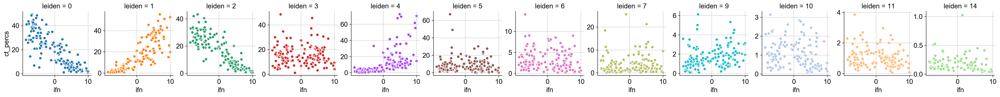

In [44]:
g = sb.FacetGrid(joined2, col="leiden",  hue="leiden", aspect=0.8, height=3, sharex=False, sharey=False, palette=sc.pl.palettes.vega_20_scanpy)
g = g.map(plt.scatter, "ifn", "ct_percs", edgecolor="w")
g.fig.subplots_adjust(wspace=0.2)
g.savefig(figdir+"/ifn.ct_cov.png")

In [ ]:
g = sb.FacetGrid(joined2, col="ct",  hue="ct", aspect=0.8, height=3, sharex=False, sharey=False, palette=sc.pl.palettes.vega_20_scanpy)
g = g.map(plt.scatter, "ifn", "ct_percs", edgecolor="w")
g.fig.subplots_adjust(wspace=0.2)
g.savefig(figdir+"/ifn.ct_cov.png")

In [49]:

##n_cts=ct_df.shape[1]-1
print('as a proportion of cell type')
for ct_i in list(range(0,len(adata.obs.leiden.cat.categories))):
    ct = ct_percs.leiden.cat.categories[ct_i]
    ct_perc = joined_pivot2_percs[ct]
    ifn = joined_pivot2_percs.ifn
    ifn = sm.add_constant(ifn)
    print('Cluster type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), ifn.astype(float),missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Beta='+str(effect)+', pvalue='+str(pval))

# fig,ax = plt.subplots(nrows=1,ncols=len(adata.obs.leiden.cat.categories), figsize=(20,4))
# fig.tight_layout()

    
# for ct_i in list(range(0,len(adata.obs.leiden.cat.categories))):
#     ct = ct_percs.leiden.cat.categories[ct_i]
#     sb.scatterplot(x="ifn", y=ct, data=joined_pivot2_percs, color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
#     ax[ct_i].get_yaxis().label.set_visible(False)
#     ##sb.swarmplot(x="disease_cov", y=ct, data=joined_pivot, color="0", size=3, ax=ax[ct_i])

    
# fig.savefig(figdir+"/ifn.ct_cov.png")



as a proportion of cell type
Cluster type:0
Beta=-2.184465902706762, pvalue=6.316744022786914e-36
Cluster type:1
Beta=2.314553811688664, pvalue=2.5482517706865723e-33
Cluster type:2
Beta=-1.8381250694343698, pvalue=1.104173038574722e-40
Cluster type:3
Beta=-0.0979447930161014, pvalue=0.47353521914289676
Cluster type:4
Beta=1.735579454575105, pvalue=2.8759395457572596e-13
Cluster type:5
Beta=-0.0023527644756863517, pvalue=0.9865228995279971
Cluster type:6
Beta=-0.05317577639637152, pvalue=0.17863030834563887
Cluster type:7
Beta=0.12052230264202128, pvalue=0.06597499419098807
Cluster type:9
Beta=0.05279213171851198, pvalue=0.0049401084335887625
Cluster type:10
Beta=-0.027923739495839803, pvalue=0.016780624070934093
Cluster type:11
Beta=-0.027595642674799074, pvalue=0.011575924456569691
Cluster type:14
Beta=-0.004608104106666891, pvalue=0.11083108545394098


In [40]:
figdir

'./figures.V5.1/'

## let's only look at disease

as a proportion of cell type
Cluster type:0
Beta=-0.057104575250834004, pvalue=4.8794969128121905e-17
Cluster type:1
Beta=0.04050705308604979, pvalue=2.3225085440124062e-07
Cluster type:2
Beta=-0.04667931530717516, pvalue=1.7021662385220274e-18
Cluster type:3
Beta=-0.003721546228390137, pvalue=0.5173661377789318
Cluster type:4
Beta=0.02434961459264518, pvalue=5.8775160345506825e-09
Cluster type:5
Beta=-0.0031449239283286054, pvalue=0.23422359202637322
Cluster type:6
Beta=-0.0019030098514049628, pvalue=0.16563675590010973
Cluster type:7
Beta=0.0021653062369734384, pvalue=0.23312190624110465
Cluster type:9
Beta=0.0004333881155067028, pvalue=0.47667380172801743
Cluster type:10
Beta=-0.0012266037014209532, pvalue=0.004395427588692698
Cluster type:11
Beta=-0.001123813952740691, pvalue=0.0002258646612048286
Cluster type:14
Beta=-0.00024991034961099683, pvalue=0.004784729596993724


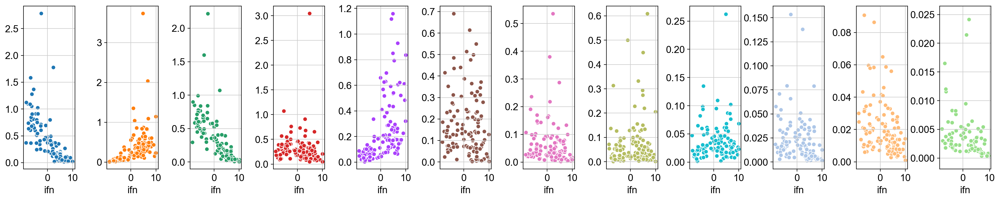

In [41]:
joined_pivot2_sle = joined_pivot2[joined_pivot2.disease_cov == "sle"]

fig,ax = plt.subplots(nrows=1,ncols=len(adata.obs.leiden.cat.categories), figsize=(20,4))
fig.tight_layout()

##n_cts=ct_df.shape[1]-1
print('as a proportion of cell type')
for ct_i in list(range(0,len(adata.obs.leiden.cat.categories))):
    ct = ct_percs.leiden.cat.categories[ct_i]
    ct_perc = joined_pivot2_sle[ct]
    ifn = joined_pivot2_sle.ifn
    ifn = sm.add_constant(ifn)
    print('Cluster type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), ifn.astype(float),missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Beta='+str(effect)+', pvalue='+str(pval))
    
for ct_i in list(range(0,len(adata.obs.leiden.cat.categories))):
    ct = ct_percs.leiden.cat.categories[ct_i]
    sb.scatterplot(x="ifn", y=ct, data=joined_pivot2_sle, color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
    ax[ct_i].get_yaxis().label.set_visible(False)
    ##sb.swarmplot(x="disease_cov", y=ct, data=joined_pivot, color="0", size=3, ax=ax[ct_i])

as a proportion of cell type
Cluster type:0
Beta=-2.325002874893569, pvalue=3.9267632344675855e-37
Cluster type:1
Beta=2.3724168148178224, pvalue=1.9470665484812604e-28
Cluster type:2
Beta=-1.9320949566358059, pvalue=1.6126018959787573e-40
Cluster type:3
Beta=0.027854025168562627, pvalue=0.8424889302197198
Cluster type:4
Beta=1.7434731591858577, pvalue=9.199657911525672e-11
Cluster type:5
Beta=0.02393818670637979, pvalue=0.8448965369679293
Cluster type:6
Beta=-0.037820966887207236, pvalue=0.39633725651638896
Cluster type:7
Beta=0.13916783289630036, pvalue=0.05910794110701169
Cluster type:9
Beta=0.05199444042993144, pvalue=0.011879872912900647
Cluster type:10
Beta=-0.03581148416438933, pvalue=0.005095757285256356
Cluster type:11
Beta=-0.032239553818844545, pvalue=0.007616559631221846
Cluster type:14
Beta=-0.005719091001764855, pvalue=0.07359807785230273


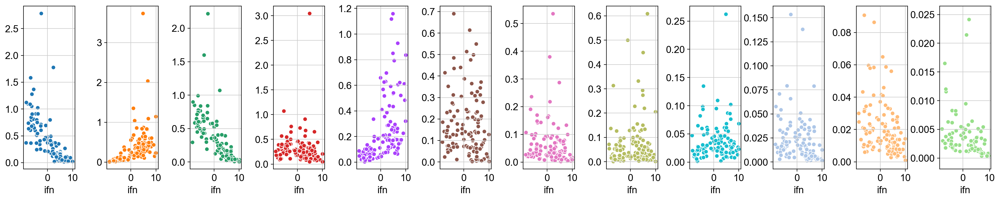

In [42]:
joined_pivot2_percs_sle = joined_pivot2_percs[joined_pivot2_percs.disease_cov == "sle"]

fig,ax = plt.subplots(nrows=1,ncols=len(adata.obs.leiden.cat.categories), figsize=(20,4))
fig.tight_layout()

##n_cts=ct_df.shape[1]-1
print('as a proportion of cell type')
for ct_i in list(range(0,len(adata.obs.leiden.cat.categories))):
    ct = ct_percs.leiden.cat.categories[ct_i]
    ct_perc = joined_pivot2_percs_sle[ct]
    ifn = joined_pivot2_percs_sle.ifn
    ifn = sm.add_constant(ifn)
    print('Cluster type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), ifn.astype(float),missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Beta='+str(effect)+', pvalue='+str(pval))
    
for ct_i in list(range(0,len(adata.obs.leiden.cat.categories))):
    ct = ct_percs.leiden.cat.categories[ct_i]
    sb.scatterplot(x="ifn", y=ct, data=joined_pivot2_sle, color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
    ax[ct_i].get_yaxis().label.set_visible(False)
    ##sb.swarmplot(x="disease_cov", y=ct, data=joined_pivot, color="0", size=3, ax=ax[ct_i])

## let's only look at healthy

as a proportion of cell type
Cluster type:0
Beta=-0.11595748095117106, pvalue=0.18211945377031474
Cluster type:1
Beta=0.021368362647917975, pvalue=0.04763395584625223
Cluster type:2
Beta=-0.08936041957838069, pvalue=0.1472419514618674
Cluster type:3
Beta=-0.10127710256367731, pvalue=0.17878663248910343
Cluster type:4
Beta=0.013154128001411188, pvalue=0.012206452624599963
Cluster type:5
Beta=0.0677815420188695, pvalue=0.3386245779561802
Cluster type:6
Beta=-0.003688690284377724, pvalue=0.6668564826076617
Cluster type:7
Beta=-0.004323904666521616, pvalue=0.6979177824927949
Cluster type:9
Beta=-0.0016812588913124793, pvalue=0.811664920227024
Cluster type:10
Beta=-0.0005524032724388448, pvalue=0.7851831688118462
Cluster type:11
Beta=0.0001634921899436332, pvalue=0.9648537712796987
Cluster type:14
Beta=0.0011758255987272938, pvalue=0.04010528777422403


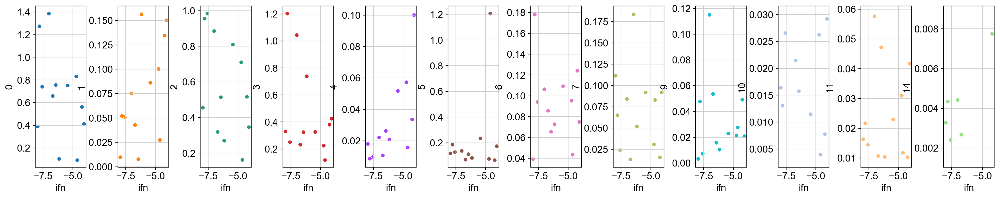

In [43]:
joined_pivot2_healthy = joined_pivot2[joined_pivot2.disease_cov == "healthy"]

fig,ax = plt.subplots(nrows=1,ncols=len(adata.obs.leiden.cat.categories), figsize=(20,4))
fig.tight_layout()

##n_cts=ct_df.shape[1]-1
print('as a proportion of cell type')
for ct_i in list(range(0,len(adata.obs.leiden.cat.categories))):
    ct = ct_percs.leiden.cat.categories[ct_i]
    ct_perc = joined_pivot2_healthy[ct]
    ifn = joined_pivot2_healthy.ifn
    ifn = sm.add_constant(ifn)
    print('Cluster type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), ifn.astype(float),missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Beta='+str(effect)+', pvalue='+str(pval))
    
for ct_i in list(range(0,len(adata.obs.leiden.cat.categories))):
    ct = ct_percs.leiden.cat.categories[ct_i]
    sb.scatterplot(x="ifn", y=ct, data=joined_pivot2_healthy, color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
    ##sb.swarmplot(x="disease_cov", y=ct, data=joined_pivot, color="0", size=3, ax=ax[ct_i])

as a proportion of cell type
Cluster type:0
Beta=-2.443176183973842, pvalue=0.349802226931627
Cluster type:1
Beta=1.2626277593451467, pvalue=0.057435685764929766
Cluster type:2
Beta=-2.0957753858779076, pvalue=0.2685784810913048
Cluster type:3
Beta=-1.951475123357393, pvalue=0.4483973556710661
Cluster type:4
Beta=0.6849388930643531, pvalue=0.012120691502071826
Cluster type:5
Beta=4.194771452464776, pvalue=0.2924581799242685
Cluster type:6
Beta=0.23666699922858764, pvalue=0.39301349843792244
Cluster type:7
Beta=-0.11774286445296078, pvalue=0.8459904741163886
Cluster type:9
Beta=0.12055083761736678, pvalue=0.6172362799799519
Cluster type:10
Beta=-0.018671058941507696, pvalue=0.8716650029181638
Cluster type:11
Beta=0.09647939257602624, pvalue=0.49706986430267963
Cluster type:14
Beta=0.07185031791354995, pvalue=0.030561276830599324


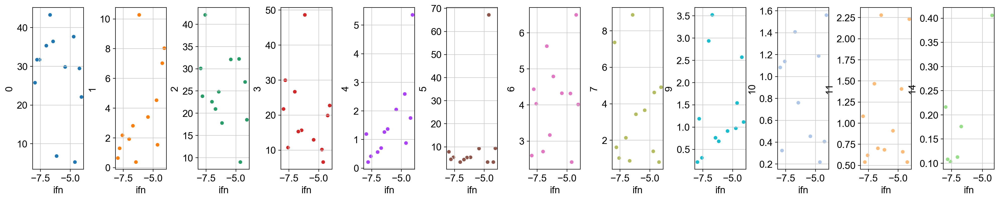

In [44]:
joined_pivot2_percs_healthy = joined_pivot2_percs[joined_pivot2_percs.disease_cov == "healthy"]

fig,ax = plt.subplots(nrows=1,ncols=len(adata.obs.leiden.cat.categories), figsize=(20,4))
fig.tight_layout()

##n_cts=ct_df.shape[1]-1
print('as a proportion of cell type')
for ct_i in list(range(0,len(adata.obs.leiden.cat.categories))):
    ct = ct_percs.leiden.cat.categories[ct_i]
    ct_perc = joined_pivot2_percs_healthy[ct]
    ifn = joined_pivot2_percs_healthy.ifn
    ifn = sm.add_constant(ifn)
    print('Cluster type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), ifn.astype(float),missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Beta='+str(effect)+', pvalue='+str(pval))
    
for ct_i in list(range(0,len(adata.obs.leiden.cat.categories))):
    ct = ct_percs.leiden.cat.categories[ct_i]
    sb.scatterplot(x="ifn", y=ct, data=joined_pivot2_percs_healthy, color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
    ##sb.swarmplot(x="disease_cov", y=ct, data=joined_pivot, color="0", size=3, ax=ax[ct_i])

# 6. Let's recompute the IFN score

In [45]:
diffexp_annot = pd.read_table("ifn.analysis/diffexp.annotations.txt", sep="\t", index_col=False)
diffexp_annot.cluster = diffexp_annot.cluster.astype("category")

/Users/yimmieg/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: read_table is deprecated, use read_csv instead.
  """Entry point for launching an IPython kernel.


FileNotFoundError: [Errno 2] File b'ifn.analysis/diffexp.annotations.txt' does not exist: b'ifn.analysis/diffexp.annotations.txt'

In [ ]:
for cluster_i in diffexp_annot.cluster.cat.categories:
    print(cluster_i)
    cluster_X = adata.X[:,adata.var_names.isin(diffexp_annot.gene[diffexp_annot.cluster==cluster_i])];
    adata.obs[cluster_i] = np.sum(cluster_X, axis=1)
    

In [ ]:
##fig,ax = plt.subplots(nrows=1,ncols=2, figsize=(10,5),sharex=True, sharey=True)
##fig.tight_layout()

sc.pl.umap(adata[adata.obs.disease_cov=="sle"], color=['all_ifn',"cM_ifn", "ncM_ifn"], size=5, vmin=0, vmax=30) ##, vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)
sc.pl.umap(adata[(adata.obs.disease_cov=="healthy") & (adata.obs.Broad == 0)], color=['all_ifn',"cM_ifn", "ncM_ifn"], size=5, vmin=0, vmax=30) ##,vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)
# sc.pl.umap(adata[(adata.obs.disease_cov=="healthy") & (adata.obs.Broad == 1)], color=['all_ifn',"myeloid_ifn","cM_ifn"], palette="Greys", size=10) ##,vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)

sc.pl.umap(adata[adata.obs.disease_cov=="sle"], color=['all_ifn',"cM_ifn", "ncM_ifn"], size=5, save='.ifn.sle.png', vmin=0, vmax=30) ##, vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)
sc.pl.umap(adata[(adata.obs.disease_cov=="healthy") & (adata.obs.Broad == 0)], color=['all_ifn',"cM_ifn", "ncM_ifn"], size=5, save='.ifn.healthy.png', vmin=0, vmax=30) ##,vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)


##sc.pl.umap(adata[adata.obs.disease_cov=="healthy",], color = "all_ifn", ax=ax[1])                                                      

In [ ]:
##fig,ax = plt.subplots(nrows=1,ncols=2, figsize=(10,5),sharex=True, sharey=True)
##fig.tight_layout()

sc.pl.umap(adata[adata.obs.disease_cov=="sle"], color=['IFI44L',"ISG15","APOBEC3B","APOBEC3A"], size=5) ##, vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)
sc.pl.umap(adata[(adata.obs.disease_cov=="healthy") & (adata.obs.Broad == 0)], color=['IFI44L',"ISG15","APOBEC3A","APOBEC3B"], size=5) ##,vmin=min(adata.obs.all_ifn), vmax=maex(adata.obs.all_ifn)*.75)
##sc.pl.umap(adata[(adata.obs.disease_cov=="healthy") & (adata.obs.Broad == 1)], color=['IFI44L',"ISG15","APOBEC3B"], size=10) ##,vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)



##sc.pl.umap(adata[adata.obs.disease_cov=="healthy",], color = "all_ifn", ax=ax[1])                                                      

In [ ]:
markers = sc.pl.umap(adata, color=['CD14',"FCGR3A","CLEC10A","C1QA"], palette="Greys", size=5,ncols=2) ##, vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)
sc.pl.umap(adata, color=['CD14',"FCGR3A","CLEC10A","C1QA"], palette="Greys", size=5, save='.types.png',ncols=2)
sc.pl.umap(adata[adata.obs.disease_cov=="sle"], color=['CD14',"FCGR3A","CLEC10A","C1QA"], palette="Greys", size=5,ncols=2) ##, vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)
sc.pl.umap(adata[adata.obs.disease_cov=="healthy"], color=['CD14',"FCGR3A","CLEC10A","C1QA"], palette="Greys", size=5,ncols=2) ##,vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)

In [ ]:
plot_df = adata.obs.groupby(['ind_cov','disease_cov','louvain'])['all_ifn'].mean()
plot_df = plot_df.reset_index(name='all_ifn_sum')

sb.catplot(x="disease_cov", y="all_ifn_sum", hue='louvain', data=plot_df, kind='violin', col='louvain', dodge=False, aspect=0.4, sharex=False, sharey=True)

##n_cts=ct_df.shape[1]-1
for cluster_i in list(range(0,8)):
    cluster = plot_df.louvain.cat.categories[cluster_i]
    all_ifn_sum = plot_df.all_ifn_sum[plot_df.louvain == cluster]
    disease = plot_df.disease_cov[plot_df.louvain==cluster].astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.OLS(all_ifn_sum.astype(float), disease.astype(float), missing='drop')
    ##est=sm.OLS("all_ifn~disease_cov", data=adata.obs.input,missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Cluster='+str(cluster)+',Beta='+str(effect)+', pvalue='+str(pval))

In [ ]:
plot_df = adata.obs.groupby(['ind_cov','disease_cov','pop_cov','louvain'])['all_ifn'].mean()
plot_df = plot_df.reset_index(name='all_ifn_sum')

sb.catplot(x="disease_cov", y="all_ifn_sum", hue='pop_cov', data=plot_df, kind='violin', col='pop_cov', dodge=False, aspect=0.4, sharex=False, sharey=True)

In [ ]:
plot_df = adata.obs.groupby(['ind_cov','disease_cov','pop_cov','louvain'])['cM_ifn'].mean()
plot_df = plot_df.reset_index(name='cM_ifn_sum')

sb.catplot(x="disease_cov", y="cM_ifn_sum", hue='pop_cov', data=plot_df, kind='violin', col='pop_cov', dodge=False, aspect=0.4, sharex=False, sharey=True)

In [ ]:
plot_df = adata.obs.groupby(['ind_cov','disease_cov','pop_cov','louvain'])['myeloid_ifn'].mean()
plot_df = plot_df.reset_index(name='myeloid_ifn_sum')

sb.catplot(x="disease_cov", y="myeloid_ifn_sum", hue='pop_cov', data=plot_df, kind='violin', col='pop_cov', dodge=False, aspect=0.4, sharex=False, sharey=True)

In [ ]:
plot_df = adata.obs.groupby(['ind_cov','disease_cov','louvain'])['cM_ifn'].mean()
plot_df = plot_df.reset_index(name='cM_ifn_sum')

sb.catplot(x="disease_cov", y="cM_ifn_sum", hue='louvain', data=plot_df, kind='violin', col='louvain', dodge=False, aspect=0.4, sharex=False, sharey=True)

##n_cts=ct_df.shape[1]-1
for cluster_i in list(range(0,8)):
    cluster = plot_df.louvain.cat.categories[cluster_i]
    cM_ifn_sum = plot_df.cM_ifn_sum[plot_df.louvain == cluster]
    disease = plot_df.disease_cov[plot_df.louvain==cluster].astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.OLS(cM_ifn_sum.astype(float), disease.astype(float), missing='drop')
    ##est=sm.OLS("cm_ifn~disease_cov", data=adata.obs.input,missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Cluster='+str(cluster)+',Beta='+str(effect)+', pvalue='+str(pval))

In [ ]:
plot_df = adata.obs.groupby(['ind_cov','disease_cov','louvain'])['myeloid_ifn'].mean()
plot_df = plot_df.reset_index(name='myeloid_ifn_sum')

sb.catplot(x="disease_cov", y="myeloid_ifn_sum", hue='louvain', data=plot_df, kind='violin', col='louvain', dodge=False, aspect=0.4, sharex=False, sharey=True)

##n_cts=ct_df.shape[1]-1
for cluster_i in list(range(0,8)):
    cluster = plot_df.louvain.cat.categories[cluster_i]
    myeloid_ifn_sum = plot_df.myeloid_ifn_sum[plot_df.louvain == cluster]
    disease = plot_df.disease_cov[plot_df.louvain==cluster].astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.OLS(myeloid_ifn_sum.astype(float), disease.astype(float), missing='drop')
    ##est=sm.OLS("myeloid_ifn~disease_cov", data=adata.obs.input,missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Cluster='+str(cluster)+',Beta='+str(effect)+', pvalue='+str(pval))

## Let's now do DPT

In [ ]:
color_map = [
    '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728',
    '#9467bd', '#8c564b', '#e377c2',
    '#bcbd22', '#17becf',
    '#aec7e8', '#ffbb78', '#98df8a', '#ff9896',
    '#c5b0d5', '#c49c94', '#f7b6d2',
    '#dbdb8d', '#9edae5',
    '#ad494a', '#8c6d31']

n_bins = 20


# Slice matrix to remove people not in Monocyte results
clues_clinical2 = pd.read_table("v2.clinical.data.txt", index_col=False)

clues_clinical2 = clues_clinical2[clues_clinical2['genotypeid'].isin(adata.obs['ind_cov'].values.tolist())]


#genes = adata.var_names[adata.var_names.isin(ifn_genes[0])].tolist()
genes = adata.var_names[adata.var_names.isin(['CD14', 'FCGR3A'])].tolist()

adata_lineage = adata[:, genes].copy()
print(adata_lineage)

# Order cells
PC = np.asarray(sc.pp.pca(adata_lineage.X, n_comps=1, copy=True)).reshape(-1,)
print(PC)
adata_lineage.obs['dpt_pseudotime'] = list(PC)
print(adata_lineage)
sc.pl.umap(adata_lineage, color='dpt_pseudotime', palette=color_map, show=False, save='MonoIFN_pseudotime.png')
#adata_lineage.write_csvs('Mono')
#adata_lineage = pd.read_csv(cellcsv)
vals = np.asarray(adata_lineage.obs['dpt_pseudotime'].values.tolist())
# For Healthy
ind_healthy = adata_lineage.obs['ind_cov'][adata_lineage.obs['disease_cov']=='healthy'].tolist()
for ind in ind_healthy:
    if ind == ind_healthy[0]:
        # pseudotime values for healthy
        healthynum = np.histogram(np.asarray(adata_lineage.obs['dpt_pseudotime'][adata_lineage.obs['ind_cov']==ind].values.tolist()), bins=n_bins, range=(np.min(vals),np.max(vals)))[0].reshape(-1,1)
        healthynum = healthynum/np.sum(healthynum)
    else:
        # pseudotime values for healthy
        healthynum0 = np.histogram(np.asarray(adata_lineage.obs['dpt_pseudotime'][adata_lineage.obs['ind_cov']==ind].values.tolist()), bins=n_bins, range=(np.min(vals),np.max(vals)))[0].reshape(-1,1)
        healthynum0 = healthynum0/np.sum(healthynum0)
        healthynum = np.concatenate((healthynum, healthynum0),axis=1)
healthyall = np.asarray(adata_lineage.obs['dpt_pseudotime'][adata_lineage.obs['ind_cov'].isin(ind_healthy)].values.tolist())

# Some SLEDAI scores to cut at
SLEDAI = [np.percentile(clues_clinical2['sledaiscore'].tolist(),25), np.percentile(clues_clinical2['sledaiscore'].tolist(),50), np.percentile(clues_clinical2['sledaiscore'].tolist(),75), np.percentile(clues_clinical2['sledaiscore'].tolist(),100)]
print(SLEDAI)
colors = ['r', 'g', 'k', 'y', 'm']
sleall = {}
#fig, ax = plt.subplots()
for ii in range(len(SLEDAI)):
    # Load Monocyte file
    #adata_lineage = pd.read_csv(cellcsv)
    #adata_lineage = sc.read(allcellspath)
    if ii == SLEDAI[0]:
        disease_sub = clues_clinical2['genotypeid'][clues_clinical2['sledaiscore'] <= SLEDAI[ii]]
    else:
        disease_sub = clues_clinical2['genotypeid'][(clues_clinical2['sledaiscore'] <= SLEDAI[ii]) & (clues_clinical2['sledaiscore'] > SLEDAI[ii-1])]
    # Slice the data to retain only people with certain SLEDAI
    bdata = adata_lineage[adata_lineage.obs['ind_cov'].isin(disease_sub.values.tolist())]
    ind_sle = bdata.obs['ind_cov'].tolist()
    for ind in ind_sle:
        if ind == ind_sle[0]:
            # pseudotime values for healthy
            slenum = np.histogram(np.asarray(bdata.obs['dpt_pseudotime'][bdata.obs['ind_cov']==ind].values.tolist()), bins=n_bins, range=(np.min(vals),np.max(vals)))[0].reshape(-1,1)
            #print('shape:')
            #print(np.shape(np.asarray(adata_lineage.obs['dpt_pseudotime'][adata_lineage.obs['ind_cov'].isin(ind_sle)].values.tolist())))
            #p1 = sb.kdeplot(np.asarray(adata_lineage.obs['dpt_pseudotime'][adata_lineage.obs['ind_cov'].isin(ind_sle)].values.tolist()), color='r')
            #print('p1')
            #print(p1)
            slenum = slenum/np.sum(slenum)
        else:
            # pseudotime values for healthy
            slenum0 = np.histogram(np.asarray(bdata.obs['dpt_pseudotime'][bdata.obs['ind_cov']==ind].values.tolist()), bins=n_bins, range=(np.min(vals),np.max(vals)))[0].reshape(-1,1)
            slenum0 = slenum0/np.sum(slenum0)
            slenum = np.concatenate((slenum, slenum0),axis=1)
    #if ii == 0:
    sleall[str(ii)] = np.asarray(adata_lineage.obs['dpt_pseudotime'][adata_lineage.obs['ind_cov'].isin(ind_sle)].values.tolist())
    #else:
    #    sleall = np.concatenate((sleall, np.asarray(adata_lineage.obs['dpt_pseudotime'][adata_lineage.obs['ind_cov'].isin(ind_sle)].values.tolist()).reshape(-1,1)), axis=1)
    print('sleall shape:')
    print(np.shape(sleall[str(ii)]))
    fig, ax = plt.subplots()
    slestd = stats.sem(slenum, axis=1)
    slenum = np.mean(slenum, axis=1)
    if ii == 0:
        healthynumstd = stats.sem(healthynum, axis=1)
        healthynum = np.mean(healthynum, axis=1)
    ind = np.arange(n_bins)
    width = 0.5
    p1 = ax.bar(ind, slenum, width, yerr= slestd, color='r', bottom=0, edgecolor = "none", label='sle')
    p1 = ax.bar(ind+width, healthynum, width, yerr=healthynumstd, color='b', bottom=0, edgecolor = "none", label='healthy')
    p1 = sb.kdeplot(sleall[str(ii)], color='r', bw=0.3)
    p1 = sb.kdeplot(healthyall, color="b",bw=0.3)
    ax.set_title(str(str(SLEDAI[ii]) + 'SLEDAI.png'))
    ax.legend()
    ax = plt.gca()
    ax.grid(False)
    ax.set_yscale('log')
    #ax.set_xscale('log')
    plt.savefig(str(str(SLEDAI[ii]) + 'SLEDAI.png'))
    plt.close()
fig, ax = plt.subplots()
for ii in range(len(SLEDAI)):
    p1 = sb.kdeplot(sleall[str(ii)], color=colors[ii], label=str(SLEDAI[ii]),bw=0.3)
    if ii ==0:
        p1 = sb.kdeplot(healthyall, color="b", label='healthy',bw=0.3)
    ax.set_title('AllSLEDAI.lineage.png')
ax.legend()
ax = plt.gca()
ax.grid(False)
ax.set_yscale('log')
#ax.set_xscale('log')
plt.savefig(figdir+'ALLSLEDAI.lineage.png')
plt.close()

In [ ]:
# Genes to order cells by
ifn_genes = pd.read_csv('ifn.lupus.crow.etal.txt', header=None)

genes = adata.var_names[adata.var_names.isin(ifn_genes[0])].tolist()

adata_ifn = adata[:, genes].copy()
print(adata_ifn)

# Order cells
PC = np.asarray(sc.pp.pca(adata_ifn.X, n_comps=1, copy=True)).reshape(-1,)
print(PC)
adata_ifn.obs['dpt_pseudotime'] = list(PC)
print(adata_ifn)
sc.pl.umap(adata_ifn, color='dpt_pseudotime', palette=color_map, show=False, save='MonoIFN_pseudotime.png')
#adata_ifn.write_csvs('Mono')
#adata_ifn = pd.read_csv(cellcsv)
vals = np.asarray(adata_ifn.obs['dpt_pseudotime'].values.tolist())
# For Healthy
ind_healthy = adata_ifn.obs['ind_cov'][adata_ifn.obs['disease_cov']=='healthy'].tolist()
for ind in ind_healthy:
    if ind == ind_healthy[0]:
        # pseudotime values for healthy
        healthynum = np.histogram(np.asarray(adata_ifn.obs['dpt_pseudotime'][adata_ifn.obs['ind_cov']==ind].values.tolist()), bins=n_bins, range=(np.min(vals),np.max(vals)))[0].reshape(-1,1)
        healthynum = healthynum/np.sum(healthynum)
    else:
        # pseudotime values for healthy
        healthynum0 = np.histogram(np.asarray(adata_ifn.obs['dpt_pseudotime'][adata_ifn.obs['ind_cov']==ind].values.tolist()), bins=n_bins, range=(np.min(vals),np.max(vals)))[0].reshape(-1,1)
        healthynum0 = healthynum0/np.sum(healthynum0)
        healthynum = np.concatenate((healthynum, healthynum0),axis=1)
healthyall = np.asarray(adata_ifn.obs['dpt_pseudotime'][adata_ifn.obs['ind_cov'].isin(ind_healthy)].values.tolist())

# Some SLEDAI scores to cut at
SLEDAI = [np.percentile(clues_clinical2['sledaiscore'].tolist(),25), np.percentile(clues_clinical2['sledaiscore'].tolist(),50), np.percentile(clues_clinical2['sledaiscore'].tolist(),75), np.percentile(clues_clinical2['sledaiscore'].tolist(),100)]
print(SLEDAI)
colors = ['r', 'g', 'k', 'y', 'm']
sleall = {}
#fig, ax = plt.subplots()
for ii in range(len(SLEDAI)):
    # Load Monocyte file
    #adata_ifn = pd.read_csv(cellcsv)
    #adata_ifn = sc.read(allcellspath)
    if ii == SLEDAI[0]:
        disease_sub = clues_clinical2['genotypeid'][clues_clinical2['sledaiscore'] <= SLEDAI[ii]]
    else:
        disease_sub = clues_clinical2['genotypeid'][(clues_clinical2['sledaiscore'] <= SLEDAI[ii]) & (clues_clinical2['sledaiscore'] > SLEDAI[ii-1])]
    # Slice the data to retain only people with certain SLEDAI
    bdata = adata_ifn[adata_ifn.obs['ind_cov'].isin(disease_sub.values.tolist())]
    ind_sle = bdata.obs['ind_cov'].tolist()
    for ind in ind_sle:
        if ind == ind_sle[0]:
            # pseudotime values for healthy
            slenum = np.histogram(np.asarray(bdata.obs['dpt_pseudotime'][bdata.obs['ind_cov']==ind].values.tolist()), bins=n_bins, range=(np.min(vals),np.max(vals)))[0].reshape(-1,1)
            #print('shape:')
            #print(np.shape(np.asarray(adata_ifn.obs['dpt_pseudotime'][adata_ifn.obs['ind_cov'].isin(ind_sle)].values.tolist())))
            #p1 = sb.kdeplot(np.asarray(adata_ifn.obs['dpt_pseudotime'][adata_ifn.obs['ind_cov'].isin(ind_sle)].values.tolist()), color='r')
            #print('p1')
            #print(p1)
            slenum = slenum/np.sum(slenum)
        else:
            # pseudotime values for healthy
            slenum0 = np.histogram(np.asarray(bdata.obs['dpt_pseudotime'][bdata.obs['ind_cov']==ind].values.tolist()), bins=n_bins, range=(np.min(vals),np.max(vals)))[0].reshape(-1,1)
            slenum0 = slenum0/np.sum(slenum0)
            slenum = np.concatenate((slenum, slenum0),axis=1)
    #if ii == 0:
    sleall[str(ii)] = np.asarray(adata_ifn.obs['dpt_pseudotime'][adata_ifn.obs['ind_cov'].isin(ind_sle)].values.tolist())
    #else:
    #    sleall = np.concatenate((sleall, np.asarray(adata_ifn.obs['dpt_pseudotime'][adata_ifn.obs['ind_cov'].isin(ind_sle)].values.tolist()).reshape(-1,1)), axis=1)
    print('sleall shape:')
    print(np.shape(sleall[str(ii)]))
    fig, ax = plt.subplots()
    slestd = stats.sem(slenum, axis=1)
    slenum = np.mean(slenum, axis=1)
    if ii == 0:
        healthynumstd = stats.sem(healthynum, axis=1)
        healthynum = np.mean(healthynum, axis=1)
    ind = np.arange(n_bins)
    width = 0.5
    p1 = ax.bar(ind, slenum, width, yerr= slestd, color='r', bottom=0, edgecolor = "none", label='sle')
    p1 = ax.bar(ind+width, healthynum, width, yerr=healthynumstd, color='b', bottom=0, edgecolor = "none", label='healthy')
    p1 = sb.kdeplot(sleall[str(ii)], color='r',bw=0.5)
    p1 = sb.kdeplot(healthyall, color="b",bw=0.5)
    ax.set_title(str(str(SLEDAI[ii]) + 'SLEDAI.png'))
    ax.legend()
    ax = plt.gca()
    ax.grid(False)
    ax.set_yscale('log')
    #ax.set_xscale('log')
    plt.savefig(str(str(SLEDAI[ii]) + 'SLEDAI.png'))
    plt.close()
fig, ax = plt.subplots()
for ii in range(len(SLEDAI)):
    p1 = sb.kdeplot(sleall[str(ii)], color=colors[ii], label=str(SLEDAI[ii]),bw=0.5)
    if ii ==0:
        p1 = sb.kdeplot(healthyall, color="b", label='healthy',bw=0.5)
    ax.set_title('AllSLEDAI.ifn.png')
ax.legend()
ax = plt.gca()
ax.grid(False)
ax.set_yscale('log')
#ax.set_xscale('log')
plt.savefig(figdir+'ALLSLEDAI.ifn.png')
plt.close()